In [2]:
import sys
sys.path.append('../')

### Libraries
from pipelines.experimental_modeling_pipeline import DiabetesPreprocessing as DP
from pipelines.experimental_modeling_pipeline import AsthmaPreprocessing as AP
from pipelines.experimental_modeling_pipeline import ClusteringAnalysis as QA
from pipelines.experimental_modeling_pipeline import Experimental_modeling_pipeline as EMP
from pipelines.experimental_modeling_pipeline import CopdPreprocessing as COPDP
from pipelines.experimental_modeling_pipeline import ObesityPreprocessing as OP
import pandas as pd
import numpy as np
import datetime
import matplotlib.pyplot as plt
from scipy import stats

dp = DP("C:/Users/keimp/")
ap = AP("C:/Users/keimp/")
copdp = COPDP("C:/Users/keimp/")
op = OP("C:/Users/keimp/")
emp = EMP()

from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
import seaborn as sns
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as imbpipeline
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from imblearn.over_sampling import KMeansSMOTE
from sklearn.cluster import MiniBatchKMeans
from imblearn.over_sampling import SVMSMOTE
from sklearn.linear_model import LinearRegression
import scipy.stats as st 
import statsmodels.stats.api as sms

from statsmodels.stats.contingency_tables import mcnemar 
from scipy.stats import fisher_exact
from scipy.stats import chi2_contingency

In [11]:
df = pd.read_csv("C:/Users/keimp/NHS/results_1", low_memory=False)

In [12]:
df['Date J43 first reported (emphysema)_binary_currentprediction'].value_counts()

0.0    490
1.0    452
Name: Date J43 first reported (emphysema)_binary_currentprediction, dtype: int64

In [9]:
meta_col_men_current = [
 '1_Diabetes_men_0_365_0_prediction',
 '1_Diabetes_men_0_365_0_predictionprob',

 '2_Diabetes_men_0_365_1_prediction',
 '2_Diabetes_men_0_365_1_predictionprob',

 '3_Diabetes_men_0_365_2_prediction',
 '3_Diabetes_men_0_365_2_predictionprob',

 '4_Diabetes_men_0_365_3_prediction',
 '4_Diabetes_men_0_365_3_predictionprob',

 '5_Diabetes_men_0_1825_0_prediction',
 '5_Diabetes_men_0_1825_0_predictionprob',

 '6_Diabetes_men_0_1825_1_prediction',
 '6_Diabetes_men_0_1825_1_predictionprob',

 '7_Diabetes_men_0_1825_2_prediction',
 '7_Diabetes_men_0_1825_2_predictionprob',

 '8_Diabetes_men_0_1825_3_prediction',
 '8_Diabetes_men_0_1825_3_predictionprob',

 '9_Diabetes_men_1825_3650_0_prediction',
 '9_Diabetes_men_1825_3650_0_predictionprob',

 '10_Diabetes_men_1825_3650_1_prediction',
 '10_Diabetes_men_1825_3650_1_predictionprob',

 '11_Diabetes_men_1825_3650_2_prediction',
 '11_Diabetes_men_1825_3650_2_predictionprob',

 '12_Diabetes_men_1825_3650_3_prediction',
 '12_Diabetes_men_1825_3650_3_predictionprob',

 '13_Diabetes_men_3650_99999999_0_prediction',
 '13_Diabetes_men_3650_99999999_0_predictionprob',

 '14_Diabetes_men_3650_99999999_1_prediction',
 '14_Diabetes_men_3650_99999999_1_predictionprob',

 '15_Diabetes_men_3650_99999999_2_prediction',
 '15_Diabetes_men_3650_99999999_2_predictionprob',

 '16_Diabetes_men_3650_99999999_3_prediction',
 '16_Diabetes_men_3650_99999999_3_predictionprob',
 'perc_nb_osteo',
 'perc_linreg_osteo',
 'perc_nb_asthma',
 'perc_linreg_asthma',
 'Date J43 first reported (emphysema)_binary_currentprediction',
 'Date J43 first reported (emphysema)_binary_currentpredictionprob',
 'Date J44 first reported (other chronic obstructive pulmonary disease)_binary_currentprediction',
 'Date J44 first reported (other chronic obstructive pulmonary disease)_binary_currentpredictionprob',
 'Date J42 first reported (unspecified chronic bronchitis)_binary_currentprediction',
 'Date J42 first reported (unspecified chronic bronchitis)_binary_currentpredictionprob',
    'Date I50 first reported (heart failure)prediction',
 'Date I50 first reported (heart failure)predictionprob',
 'Date I25 first reported (chronic ischaemic heart disease)prediction',
 'Date I25 first reported (chronic ischaemic heart disease)predictionprob'
]
meta_col_men_past = [
 '1_Diabetes_men_0_365_0_prediction',
 '1_Diabetes_men_0_365_0_predictionprob',

 '2_Diabetes_men_0_365_1_prediction',
 '2_Diabetes_men_0_365_1_predictionprob',

 '3_Diabetes_men_0_365_2_prediction',
 '3_Diabetes_men_0_365_2_predictionprob',

 '4_Diabetes_men_0_365_3_prediction',
 '4_Diabetes_men_0_365_3_predictionprob',

 '5_Diabetes_men_0_1825_0_prediction',
 '5_Diabetes_men_0_1825_0_predictionprob',

 '6_Diabetes_men_0_1825_1_prediction',
 '6_Diabetes_men_0_1825_1_predictionprob',

 '7_Diabetes_men_0_1825_2_prediction',
 '7_Diabetes_men_0_1825_2_predictionprob',

 '8_Diabetes_men_0_1825_3_prediction',
 '8_Diabetes_men_0_1825_3_predictionprob',

 '9_Diabetes_men_1825_3650_0_prediction',
 '9_Diabetes_men_1825_3650_0_predictionprob',

 '10_Diabetes_men_1825_3650_1_prediction',
 '10_Diabetes_men_1825_3650_1_predictionprob',

 '11_Diabetes_men_1825_3650_2_prediction',
 '11_Diabetes_men_1825_3650_2_predictionprob',

 '12_Diabetes_men_1825_3650_3_prediction',
 '12_Diabetes_men_1825_3650_3_predictionprob',

 '13_Diabetes_men_3650_99999999_0_prediction',
 '13_Diabetes_men_3650_99999999_0_predictionprob',

 '14_Diabetes_men_3650_99999999_1_prediction',
 '14_Diabetes_men_3650_99999999_1_predictionprob',

 '15_Diabetes_men_3650_99999999_2_prediction',
 '15_Diabetes_men_3650_99999999_2_predictionprob',

 '16_Diabetes_men_3650_99999999_3_prediction',
 '16_Diabetes_men_3650_99999999_3_predictionprob',
 'perc_nb_osteo',
 'perc_linreg_osteo',
 'perc_nb_asthma',
 'perc_linreg_asthma',
'Date J43 first reported (emphysema)_binary_pastprediction',
 'Date J43 first reported (emphysema)_binary_pastpredictionprob',
 'Date J44 first reported (other chronic obstructive pulmonary disease)_binary_pastprediction',
 'Date J44 first reported (other chronic obstructive pulmonary disease)_binary_pastpredictionprob',
    'Date I50 first reported (heart failure)prediction',
 'Date I50 first reported (heart failure)predictionprob',
 'Date I25 first reported (chronic ischaemic heart disease)prediction',
 'Date I25 first reported (chronic ischaemic heart disease)predictionprob'
]
meta_col_women_current = [
'perc_nb_osteo',
 'perc_linreg_osteo',
 'perc_nb_asthma',
 'perc_linreg_asthma',

 '1_Diabetes_women_0_365_0_prediction',
 '1_Diabetes_women_0_365_0_predictionprob',

 '2_Diabetes_women_0_365_1_prediction',
 '2_Diabetes_women_0_365_1_predictionprob',

 '3_Diabetes_women_0_365_2_prediction',
 '3_Diabetes_women_0_365_2_predictionprob',

 '4_Diabetes_women_0_365_3_prediction',
 '4_Diabetes_women_0_365_3_predictionprob',

 '5_Diabetes_women_0_1825_0_prediction',
 '5_Diabetes_women_0_1825_0_predictionprob',

 '6_Diabetes_women_0_1825_1_prediction',
 '6_Diabetes_women_0_1825_1_predictionprob',

 '7_Diabetes_women_0_1825_2_prediction',
 '7_Diabetes_women_0_1825_2_predictionprob',

 '8_Diabetes_women_0_1825_3_prediction',
 '8_Diabetes_women_0_1825_3_predictionprob',

 '9_Diabetes_women_1825_3650_0_prediction',
 '9_Diabetes_women_1825_3650_0_predictionprob',

 '10_Diabetes_women_1825_3650_1_prediction',
 '10_Diabetes_women_1825_3650_1_predictionprob',

 '11_Diabetes_women_1825_3650_2_prediction',
 '11_Diabetes_women_1825_3650_2_predictionprob',

 '12_Diabetes_women_1825_3650_3_prediction',
 '12_Diabetes_women_1825_3650_3_predictionprob',

 '13_Diabetes_women_3650_99999999_0_prediction',
 '13_Diabetes_women_3650_99999999_0_predictionprob',

 '14_Diabetes_women_3650_99999999_1_prediction',
 '14_Diabetes_women_3650_99999999_1_predictionprob',

 '15_Diabetes_women_3650_99999999_2_prediction',
 '15_Diabetes_women_3650_99999999_2_predictionprob',

 '16_Diabetes_women_3650_99999999_3_prediction',
 '16_Diabetes_women_3650_99999999_3_predictionprob',
 'Date J43 first reported (emphysema)_binary_currentprediction',
 'Date J43 first reported (emphysema)_binary_currentpredictionprob',
 'Date J44 first reported (other chronic obstructive pulmonary disease)_binary_currentprediction',
 'Date J44 first reported (other chronic obstructive pulmonary disease)_binary_currentpredictionprob',
 'Date J42 first reported (unspecified chronic bronchitis)_binary_currentprediction',
 'Date J42 first reported (unspecified chronic bronchitis)_binary_currentpredictionprob',
    'Date I50 first reported (heart failure)prediction',
 'Date I50 first reported (heart failure)predictionprob',
 'Date I25 first reported (chronic ischaemic heart disease)prediction',
 'Date I25 first reported (chronic ischaemic heart disease)predictionprob'
]
meta_col_women_past = [
'perc_nb_osteo',
 'perc_linreg_osteo',
 'perc_nb_asthma',
 'perc_linreg_asthma',

 '1_Diabetes_women_0_365_0_prediction',
 '1_Diabetes_women_0_365_0_predictionprob',

 '2_Diabetes_women_0_365_1_prediction',
 '2_Diabetes_women_0_365_1_predictionprob',

 '3_Diabetes_women_0_365_2_prediction',
 '3_Diabetes_women_0_365_2_predictionprob',

 '4_Diabetes_women_0_365_3_prediction',
 '4_Diabetes_women_0_365_3_predictionprob',

 '5_Diabetes_women_0_1825_0_prediction',
 '5_Diabetes_women_0_1825_0_predictionprob',

 '6_Diabetes_women_0_1825_1_prediction',
 '6_Diabetes_women_0_1825_1_predictionprob',

 '7_Diabetes_women_0_1825_2_prediction',
 '7_Diabetes_women_0_1825_2_predictionprob',

 '8_Diabetes_women_0_1825_3_prediction',
 '8_Diabetes_women_0_1825_3_predictionprob',

 '9_Diabetes_women_1825_3650_0_prediction',
 '9_Diabetes_women_1825_3650_0_predictionprob',

 '10_Diabetes_women_1825_3650_1_prediction',
 '10_Diabetes_women_1825_3650_1_predictionprob',

 '11_Diabetes_women_1825_3650_2_prediction',
 '11_Diabetes_women_1825_3650_2_predictionprob',

 '12_Diabetes_women_1825_3650_3_prediction',
 '12_Diabetes_women_1825_3650_3_predictionprob',

 '13_Diabetes_women_3650_99999999_0_prediction',
 '13_Diabetes_women_3650_99999999_0_predictionprob',

 '14_Diabetes_women_3650_99999999_1_prediction',
 '14_Diabetes_women_3650_99999999_1_predictionprob',

 '15_Diabetes_women_3650_99999999_2_prediction',
 '15_Diabetes_women_3650_99999999_2_predictionprob',

 '16_Diabetes_women_3650_99999999_3_prediction',
 '16_Diabetes_women_3650_99999999_3_predictionprob',
'Date J43 first reported (emphysema)_binary_pastprediction',
 'Date J43 first reported (emphysema)_binary_pastpredictionprob',
 'Date J44 first reported (other chronic obstructive pulmonary disease)_binary_pastprediction',
 'Date J44 first reported (other chronic obstructive pulmonary disease)_binary_pastpredictionprob',
'Date I50 first reported (heart failure)prediction',
 'Date I50 first reported (heart failure)predictionprob',
 'Date I25 first reported (chronic ischaemic heart disease)prediction',
 'Date I25 first reported (chronic ischaemic heart disease)predictionprob'
]

In [7]:
def analysis_function(cols, label, sample):
    if sample:
        tdf = df[cols+[label]].dropna()
        l = tdf[tdf[label]==1]
        h = tdf[tdf[label]==0]
        cohort = pd.concat([l,h.sample(n=l.shape[0])])
    else:
        cohort = df[cols+[label]].dropna()
    
    emp.pipeline(cohort
                 ,label,
                 cols, 0.25, splits= 5)
    
    print("FEATURE IMPORTANCE")
    X = cohort[cols]
    y = cohort[label]
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    
    model = LogisticRegression()
    model.fit(X_train, y_train)
    
    coefficients = model.coef_[0]
    
    feature_importance = pd.DataFrame({'Feature': X.columns, 'Importance': np.abs(coefficients)})
    feature_importance = feature_importance.sort_values('Importance', ascending=True)
    feature_importance = feature_importance.iloc[feature_importance.shape[0]-20:feature_importance.shape[0]]
    plt.barh(y=feature_importance.Feature, width=feature_importance.Importance)
    plt.show()

### META LEARNERS

#### Emphysema

#### Current men

In [166]:
df[meta_col_men_current+['Date J43 first reported (emphysema)_binary']].dropna().shape

(8023, 47)

##### UNSAMPLED

Number of missing values: 
 1_Diabetes_men_0_365_0_prediction                                                                     0
1_Diabetes_men_0_365_0_predictionprob                                                                 0
2_Diabetes_men_0_365_1_prediction                                                                     0
2_Diabetes_men_0_365_1_predictionprob                                                                 0
3_Diabetes_men_0_365_2_prediction                                                                     0
3_Diabetes_men_0_365_2_predictionprob                                                                 0
4_Diabetes_men_0_365_3_prediction                                                                     0
4_Diabetes_men_0_365_3_predictionprob                                                                 0
5_Diabetes_men_0_1825_0_prediction                                                                    0
5_Diabetes_men_0_1825_0_predictionpr

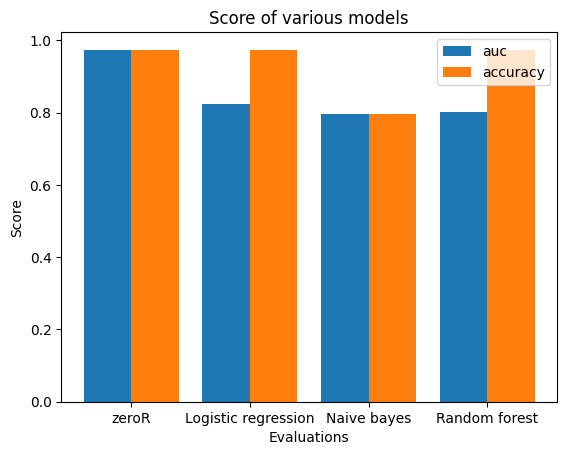

F1:  0.0 0.14050971763464862 0.027906976744186046
auc:  [0.9740745357098343, 0.8239790955628229, 0.7962877384463453, 0.803004288337372]
accuracy:  [0.9740745357098343, 0.9740746265178176, 0.7955863456623239, 0.9741992371097179]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


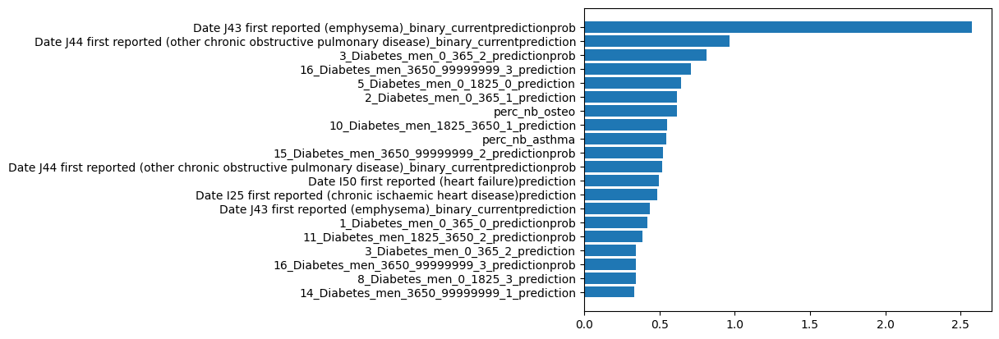

In [167]:
analysis_function(meta_col_men_current, 'Date J43 first reported (emphysema)_binary', False)

##### SAMPLED

Number of missing values: 
 1_Diabetes_men_0_365_0_prediction                                                                     0
1_Diabetes_men_0_365_0_predictionprob                                                                 0
2_Diabetes_men_0_365_1_prediction                                                                     0
2_Diabetes_men_0_365_1_predictionprob                                                                 0
3_Diabetes_men_0_365_2_prediction                                                                     0
3_Diabetes_men_0_365_2_predictionprob                                                                 0
4_Diabetes_men_0_365_3_prediction                                                                     0
4_Diabetes_men_0_365_3_predictionprob                                                                 0
5_Diabetes_men_0_1825_0_prediction                                                                    0
5_Diabetes_men_0_1825_0_predictionpr

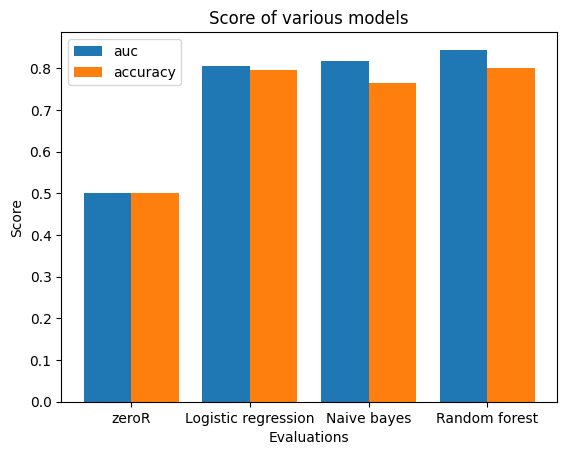

F1:  0.7885748859489241 0.763737850309013 0.8026598379581041
auc:  [0.5, 0.8063492063492064, 0.8176566561583983, 0.8446131298047674]
accuracy:  [0.5, 0.7957257601835915, 0.7645438898450947, 0.8005163511187607]
FEATURE IMPORTANCE


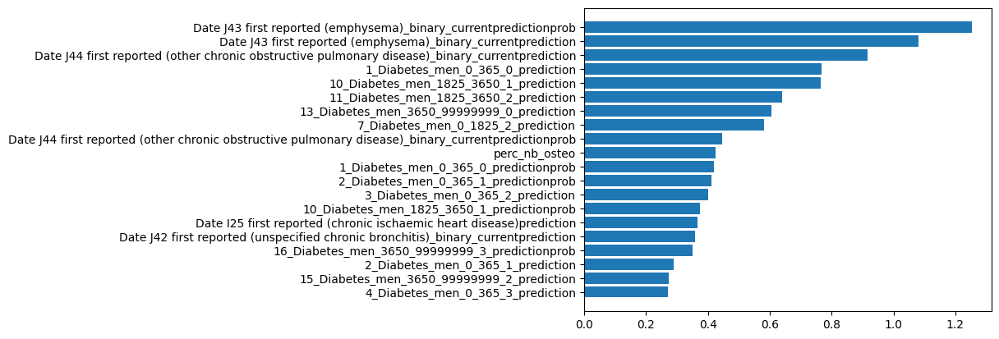

In [168]:
analysis_function(meta_col_men_current, 'Date J43 first reported (emphysema)_binary', True)

### Past men

##### Unsampled

Number of missing values: 
 1_Diabetes_men_0_365_0_prediction                                                                  0
1_Diabetes_men_0_365_0_predictionprob                                                              0
2_Diabetes_men_0_365_1_prediction                                                                  0
2_Diabetes_men_0_365_1_predictionprob                                                              0
3_Diabetes_men_0_365_2_prediction                                                                  0
3_Diabetes_men_0_365_2_predictionprob                                                              0
4_Diabetes_men_0_365_3_prediction                                                                  0
4_Diabetes_men_0_365_3_predictionprob                                                              0
5_Diabetes_men_0_1825_0_prediction                                                                 0
5_Diabetes_men_0_1825_0_predictionprob                         

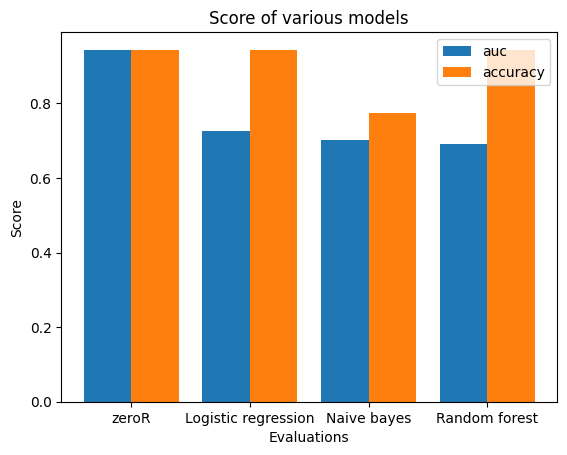

F1:  0.0 0.15532415685964696 0.0
auc:  [0.9441023211747986, 0.7259888761303156, 0.701087581673578, 0.6912456999136104]
accuracy:  [0.9441023211747986, 0.9441027192363282, 0.7731123883791021, 0.9431548519377501]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


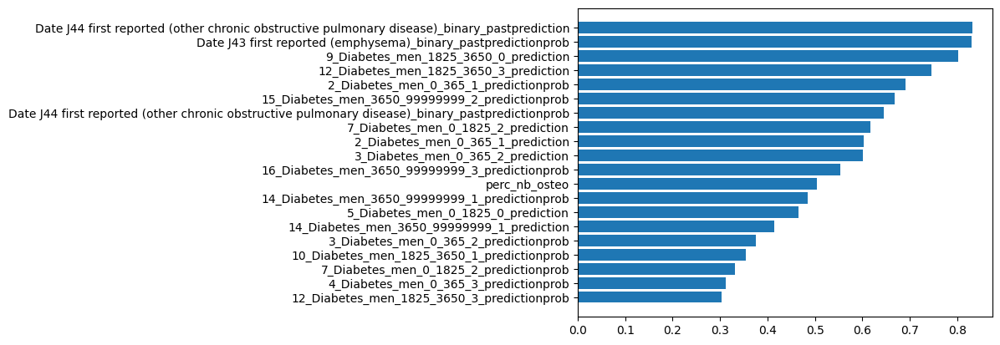

In [169]:
analysis_function(meta_col_men_past, 'Date J43 first reported (emphysema)_binary', False)

#### sampled

Number of missing values: 
 1_Diabetes_men_0_365_0_prediction                                                                  0
1_Diabetes_men_0_365_0_predictionprob                                                              0
2_Diabetes_men_0_365_1_prediction                                                                  0
2_Diabetes_men_0_365_1_predictionprob                                                              0
3_Diabetes_men_0_365_2_prediction                                                                  0
3_Diabetes_men_0_365_2_predictionprob                                                              0
4_Diabetes_men_0_365_3_prediction                                                                  0
4_Diabetes_men_0_365_3_predictionprob                                                              0
5_Diabetes_men_0_1825_0_prediction                                                                 0
5_Diabetes_men_0_1825_0_predictionprob                         

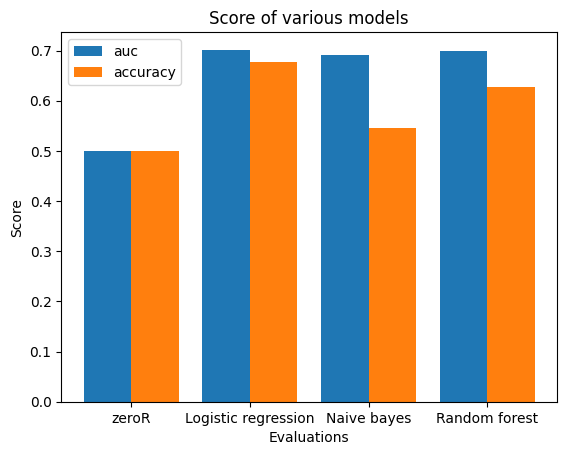

F1:  0.6919797662654805 0.40894654140064174 0.6223202480027555
auc:  [0.5, 0.701766304347826, 0.6902626811594202, 0.6999471618357488]
accuracy:  [0.5, 0.6781914893617021, 0.5463652482269503, 0.6273936170212766]
FEATURE IMPORTANCE


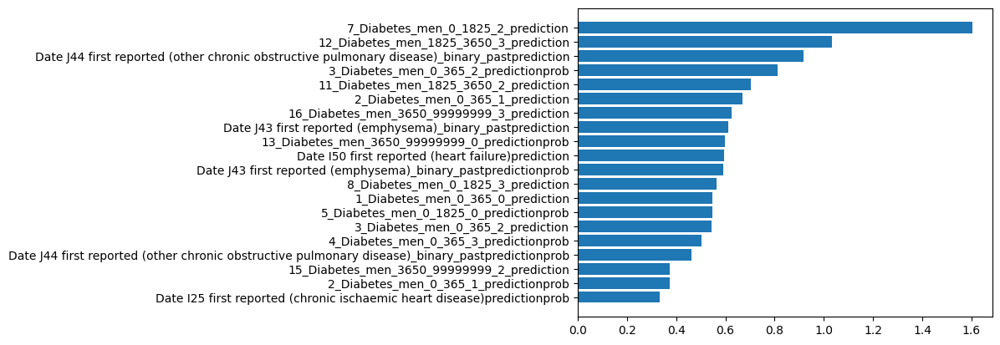

In [170]:
analysis_function(meta_col_men_past, 'Date J43 first reported (emphysema)_binary', True)

#### Current women

##### Unsampled

Number of missing values: 
 perc_nb_osteo                                                                                         0
perc_linreg_osteo                                                                                     0
perc_nb_asthma                                                                                        0
perc_linreg_asthma                                                                                    0
1_Diabetes_women_0_365_0_prediction                                                                   0
1_Diabetes_women_0_365_0_predictionprob                                                               0
2_Diabetes_women_0_365_1_prediction                                                                   0
2_Diabetes_women_0_365_1_predictionprob                                                               0
3_Diabetes_women_0_365_2_prediction                                                                   0
3_Diabetes_women_0_365_2_predictionp

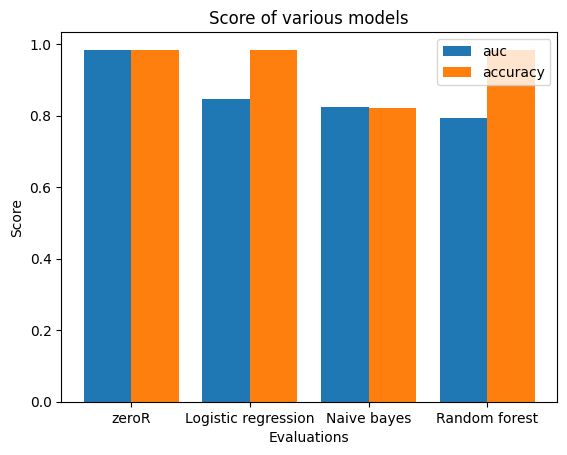

F1:  0.0 0.09322146197007491 0.0
auc:  [0.9844961240310077, 0.8453334715015661, 0.8232757551123144, 0.794835728589979]
accuracy:  [0.9844961240310077, 0.984496163951547, 0.8227082326986439, 0.984496163951547]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


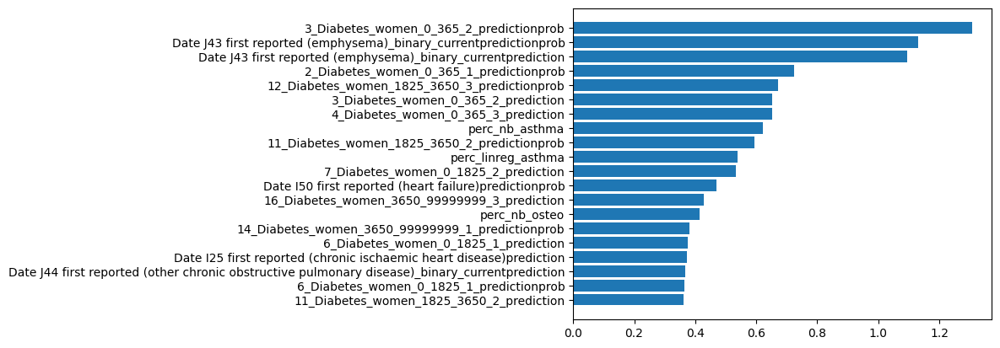

In [171]:
analysis_function(meta_col_women_current, 'Date J43 first reported (emphysema)_binary', False)

### Sampled

Number of missing values: 
 perc_nb_osteo                                                                                         0
perc_linreg_osteo                                                                                     0
perc_nb_asthma                                                                                        0
perc_linreg_asthma                                                                                    0
1_Diabetes_women_0_365_0_prediction                                                                   0
1_Diabetes_women_0_365_0_predictionprob                                                               0
2_Diabetes_women_0_365_1_prediction                                                                   0
2_Diabetes_women_0_365_1_predictionprob                                                               0
3_Diabetes_women_0_365_2_prediction                                                                   0
3_Diabetes_women_0_365_2_predictionp

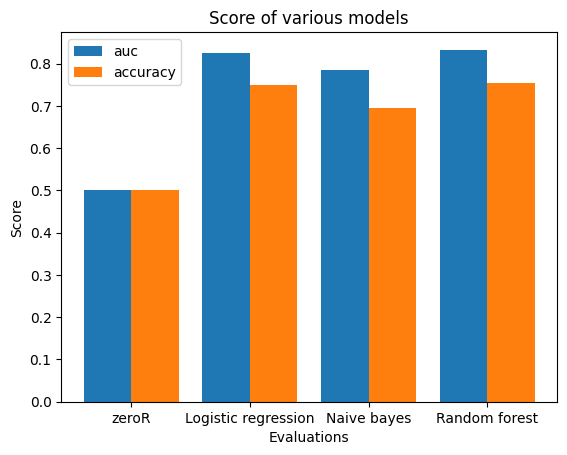

F1:  0.7393316224587873 0.6736554305668218 0.7551257823703644
auc:  [0.5, 0.8255804801259347, 0.7840515545061, 0.8331562377016922]
accuracy:  [0.5, 0.75, 0.6943974630021141, 0.7543340380549682]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


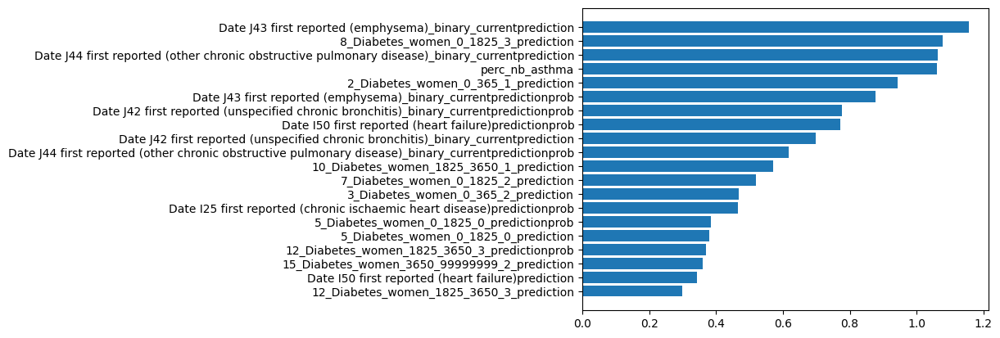

In [172]:
analysis_function(meta_col_women_current, 'Date J43 first reported (emphysema)_binary', True)

#### Past women

##### Unsampled

Number of missing values: 
 perc_nb_osteo                                                                                      0
perc_linreg_osteo                                                                                  0
perc_nb_asthma                                                                                     0
perc_linreg_asthma                                                                                 0
1_Diabetes_women_0_365_0_prediction                                                                0
1_Diabetes_women_0_365_0_predictionprob                                                            0
2_Diabetes_women_0_365_1_prediction                                                                0
2_Diabetes_women_0_365_1_predictionprob                                                            0
3_Diabetes_women_0_365_2_prediction                                                                0
3_Diabetes_women_0_365_2_predictionprob                        

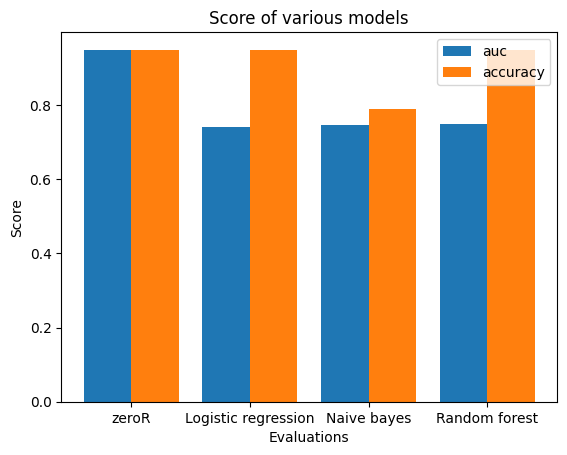

F1:  0.0 0.2092131884976144 0.0
auc:  [0.949786830885836, 0.740597640098887, 0.7457627576081441, 0.7491617277153436]
accuracy:  [0.949786830885836, 0.94836812207993, 0.7910938567891276, 0.9493137485574714]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


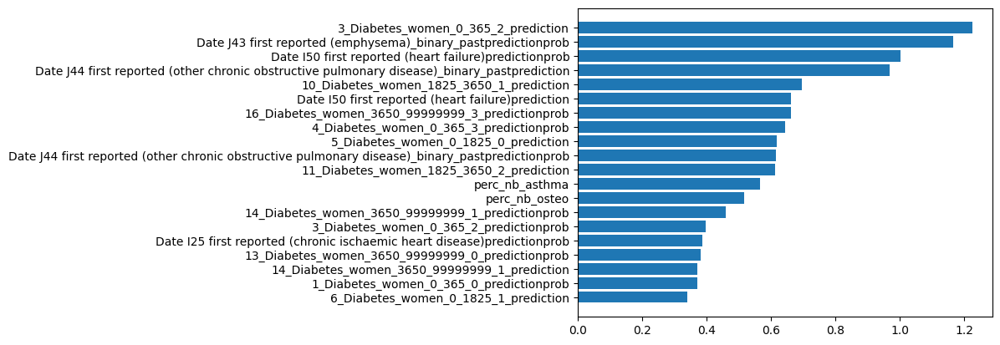

In [173]:
analysis_function(meta_col_women_past, 'Date J43 first reported (emphysema)_binary', False)

##### Sampled

Number of missing values: 
 perc_nb_osteo                                                                                      0
perc_linreg_osteo                                                                                  0
perc_nb_asthma                                                                                     0
perc_linreg_asthma                                                                                 0
1_Diabetes_women_0_365_0_prediction                                                                0
1_Diabetes_women_0_365_0_predictionprob                                                            0
2_Diabetes_women_0_365_1_prediction                                                                0
2_Diabetes_women_0_365_1_predictionprob                                                            0
3_Diabetes_women_0_365_2_prediction                                                                0
3_Diabetes_women_0_365_2_predictionprob                        

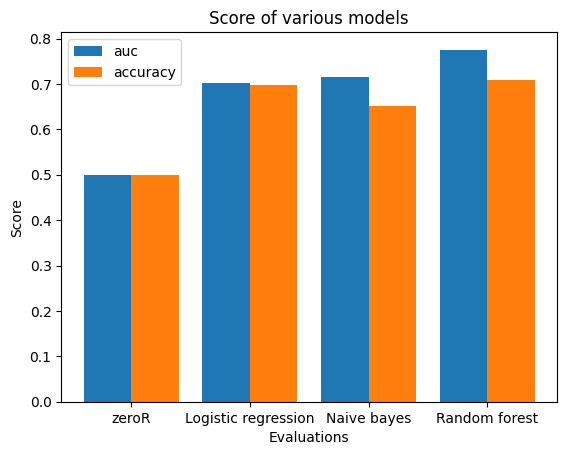

F1:  0.6934068541642354 0.6620804381572415 0.7045320750477474
auc:  [0.5, 0.702679859822717, 0.7146155431869717, 0.7755205112347969]
accuracy:  [0.5, 0.6984496124031008, 0.6510520487264674, 0.7080841638981173]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


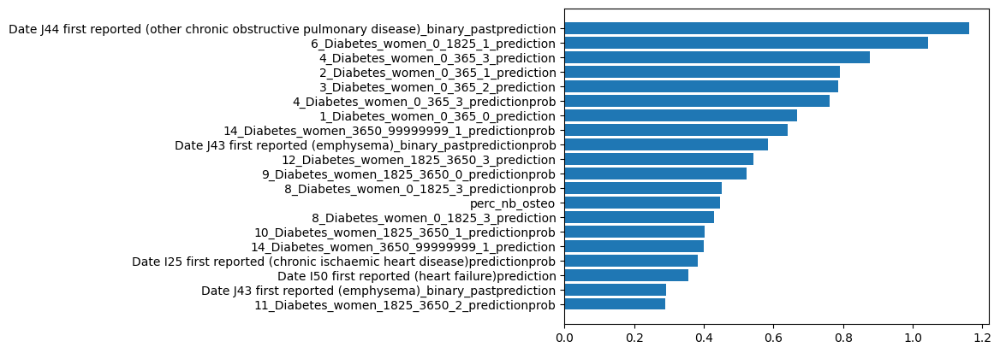

In [174]:
analysis_function(meta_col_women_past, 'Date J43 first reported (emphysema)_binary', True)

### Bronchitis

#### Current men 

##### Unsampled

Number of missing values: 
 1_Diabetes_men_0_365_0_prediction                                                                     0
1_Diabetes_men_0_365_0_predictionprob                                                                 0
2_Diabetes_men_0_365_1_prediction                                                                     0
2_Diabetes_men_0_365_1_predictionprob                                                                 0
3_Diabetes_men_0_365_2_prediction                                                                     0
3_Diabetes_men_0_365_2_predictionprob                                                                 0
4_Diabetes_men_0_365_3_prediction                                                                     0
4_Diabetes_men_0_365_3_predictionprob                                                                 0
5_Diabetes_men_0_1825_0_prediction                                                                    0
5_Diabetes_men_0_1825_0_predictionpr

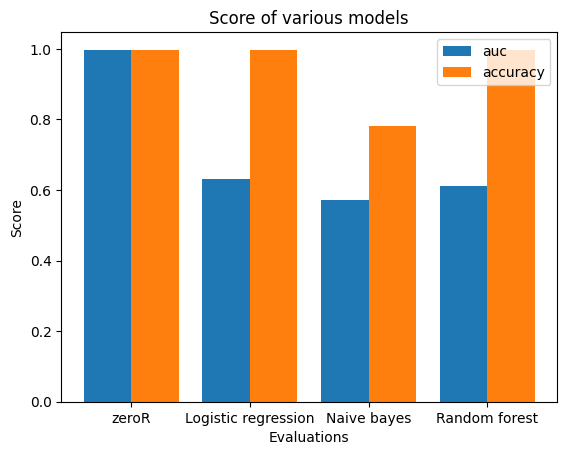

F1:  0.0 0.0047900818726692475 0.0
auc:  [0.9977564502056587, 0.6308869456589631, 0.5715750572558818, 0.6117166354361857]
accuracy:  [0.9977564502056587, 0.9977565432213858, 0.7815208085704741, 0.9977565432213858]
FEATURE IMPORTANCE


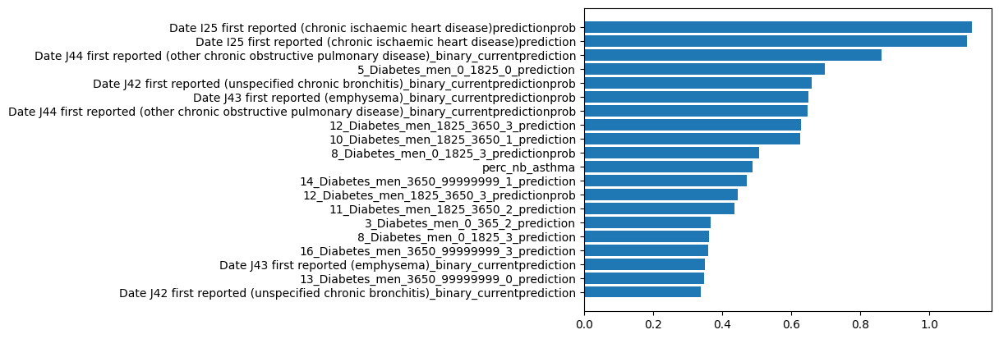

In [175]:
analysis_function(meta_col_men_current, 'Date J42 first reported (unspecified chronic bronchitis)_binary', False)

##### Sampled

Number of missing values: 
 1_Diabetes_men_0_365_0_prediction                                                                     0
1_Diabetes_men_0_365_0_predictionprob                                                                 0
2_Diabetes_men_0_365_1_prediction                                                                     0
2_Diabetes_men_0_365_1_predictionprob                                                                 0
3_Diabetes_men_0_365_2_prediction                                                                     0
3_Diabetes_men_0_365_2_predictionprob                                                                 0
4_Diabetes_men_0_365_3_prediction                                                                     0
4_Diabetes_men_0_365_3_predictionprob                                                                 0
5_Diabetes_men_0_1825_0_prediction                                                                    0
5_Diabetes_men_0_1825_0_predictionpr

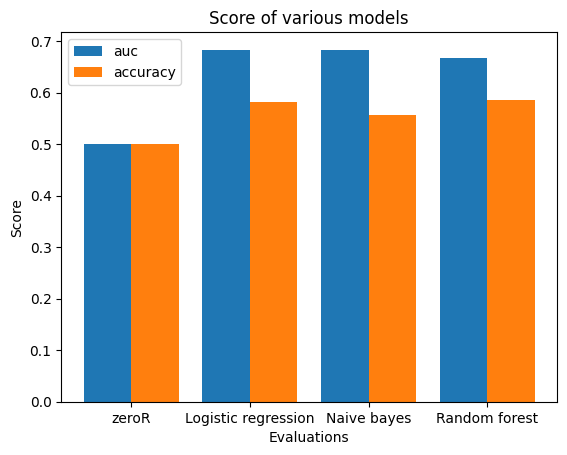

F1:  0.5352380952380953 0.4166666666666667 0.4777777777777778
auc:  [0.5, 0.6833333333333333, 0.6833333333333333, 0.6666666666666666]
accuracy:  [0.5, 0.5821428571428571, 0.5571428571428572, 0.5857142857142857]
FEATURE IMPORTANCE


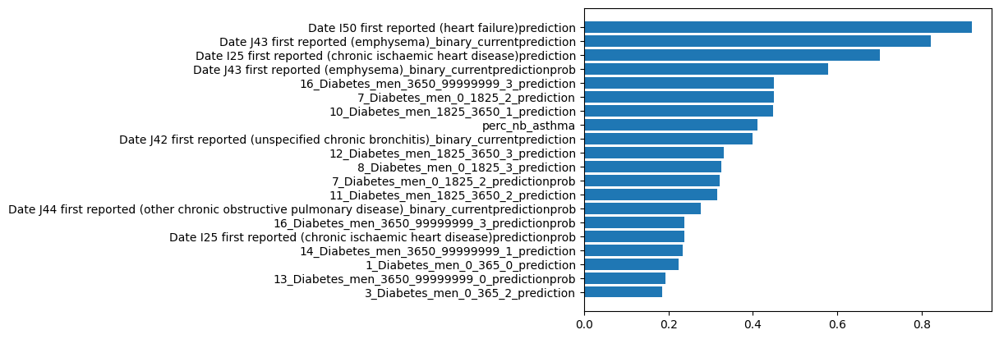

In [176]:
analysis_function(meta_col_men_current, 'Date J42 first reported (unspecified chronic bronchitis)_binary', True)

#### Current women

##### Unsampled 

Number of missing values: 
 perc_nb_osteo                                                                                         0
perc_linreg_osteo                                                                                     0
perc_nb_asthma                                                                                        0
perc_linreg_asthma                                                                                    0
1_Diabetes_women_0_365_0_prediction                                                                   0
1_Diabetes_women_0_365_0_predictionprob                                                               0
2_Diabetes_women_0_365_1_prediction                                                                   0
2_Diabetes_women_0_365_1_predictionprob                                                               0
3_Diabetes_women_0_365_2_prediction                                                                   0
3_Diabetes_women_0_365_2_predictionp

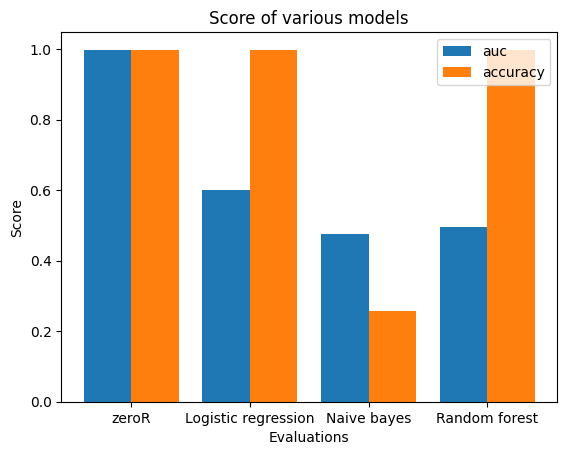

F1:  0.0 0.0022910428674108594 0.0
auc:  [0.9985644559287971, 0.6007003148318005, 0.47550357077931205, 0.49702448829503293]
accuracy:  [0.9985644559287971, 0.998564455810514, 0.25796980392843494, 0.998564455810514]
FEATURE IMPORTANCE


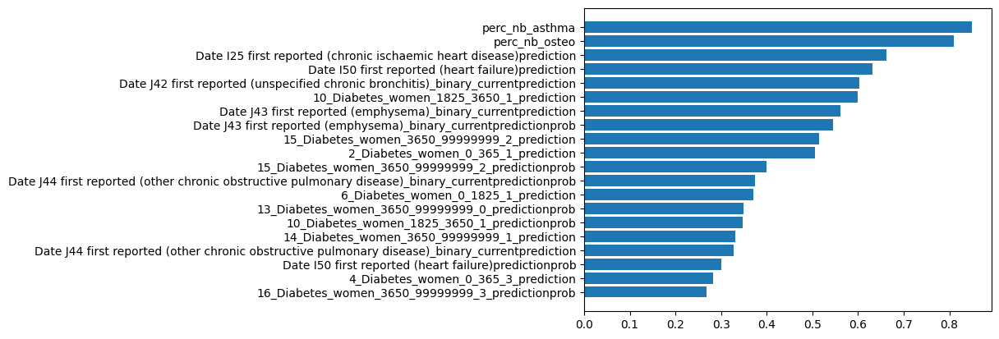

In [177]:
analysis_function(meta_col_women_current, 'Date J42 first reported (unspecified chronic bronchitis)_binary', False)

##### Sampled

Number of missing values: 
 perc_nb_osteo                                                                                         0
perc_linreg_osteo                                                                                     0
perc_nb_asthma                                                                                        0
perc_linreg_asthma                                                                                    0
1_Diabetes_women_0_365_0_prediction                                                                   0
1_Diabetes_women_0_365_0_predictionprob                                                               0
2_Diabetes_women_0_365_1_prediction                                                                   0
2_Diabetes_women_0_365_1_predictionprob                                                               0
3_Diabetes_women_0_365_2_prediction                                                                   0
3_Diabetes_women_0_365_2_predictionp

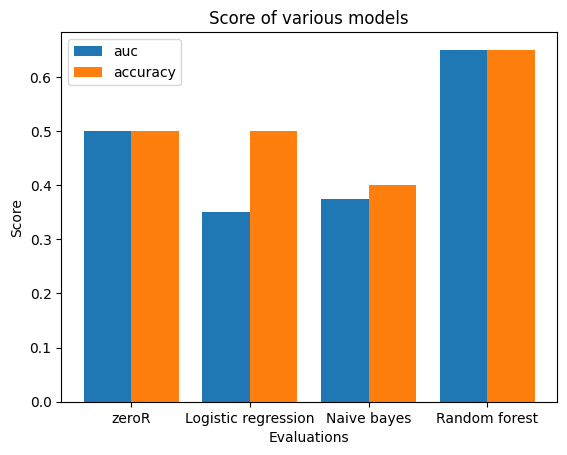

F1:  0.48 0.46 0.6333333333333333
auc:  [0.5, 0.35, 0.375, 0.65]
accuracy:  [0.5, 0.5, 0.4, 0.65]
FEATURE IMPORTANCE


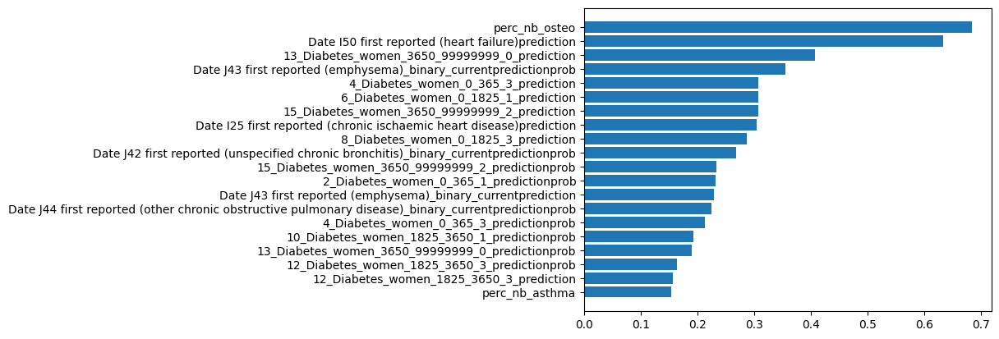

In [178]:
analysis_function(meta_col_women_current, 'Date J42 first reported (unspecified chronic bronchitis)_binary', True)

### Other copd

#### Men current

##### Unsampled

Number of missing values: 
 1_Diabetes_men_0_365_0_prediction                                                                     0
1_Diabetes_men_0_365_0_predictionprob                                                                 0
2_Diabetes_men_0_365_1_prediction                                                                     0
2_Diabetes_men_0_365_1_predictionprob                                                                 0
3_Diabetes_men_0_365_2_prediction                                                                     0
3_Diabetes_men_0_365_2_predictionprob                                                                 0
4_Diabetes_men_0_365_3_prediction                                                                     0
4_Diabetes_men_0_365_3_predictionprob                                                                 0
5_Diabetes_men_0_1825_0_prediction                                                                    0
5_Diabetes_men_0_1825_0_predictionpr

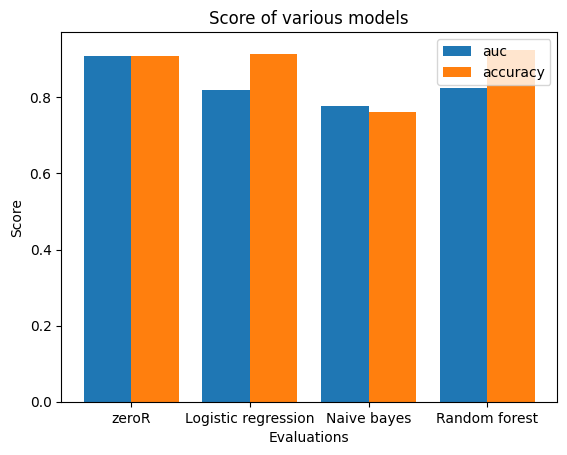

F1:  0.270206347269933 0.3219554368867385 0.3823728491310361
auc:  [0.9086376667082139, 0.818271276415559, 0.7765866592423091, 0.8238263174559711]
accuracy:  [0.9086376667082139, 0.9134991959353952, 0.7604362924464539, 0.9253398435375735]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


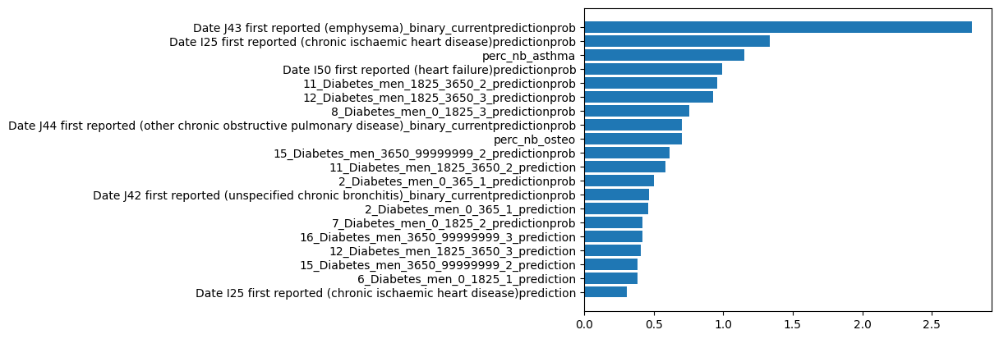

In [179]:
analysis_function(meta_col_men_current, 'Date J44 first reported (other chronic obstructive pulmonary disease)_binary', False)

##### Sampled

Number of missing values: 
 1_Diabetes_men_0_365_0_prediction                                                                     0
1_Diabetes_men_0_365_0_predictionprob                                                                 0
2_Diabetes_men_0_365_1_prediction                                                                     0
2_Diabetes_men_0_365_1_predictionprob                                                                 0
3_Diabetes_men_0_365_2_prediction                                                                     0
3_Diabetes_men_0_365_2_predictionprob                                                                 0
4_Diabetes_men_0_365_3_prediction                                                                     0
4_Diabetes_men_0_365_3_predictionprob                                                                 0
5_Diabetes_men_0_1825_0_prediction                                                                    0
5_Diabetes_men_0_1825_0_predictionpr

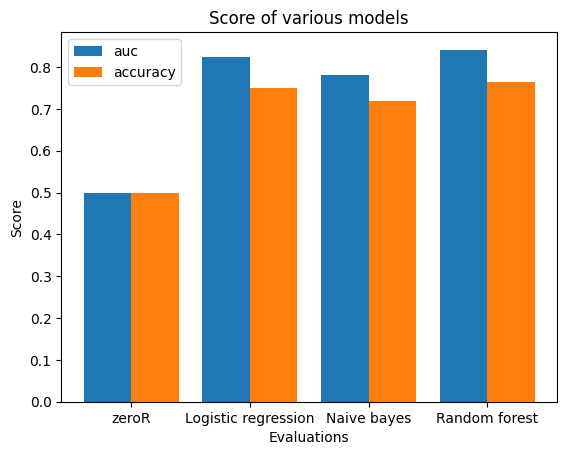

F1:  0.7399501673906628 0.7119128602517389 0.7655561326293033
auc:  [0.5, 0.8232885587372587, 0.7809681341551624, 0.8415434461921941]
accuracy:  [0.5, 0.7503378143066101, 0.7189895753523252, 0.7646699635485593]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


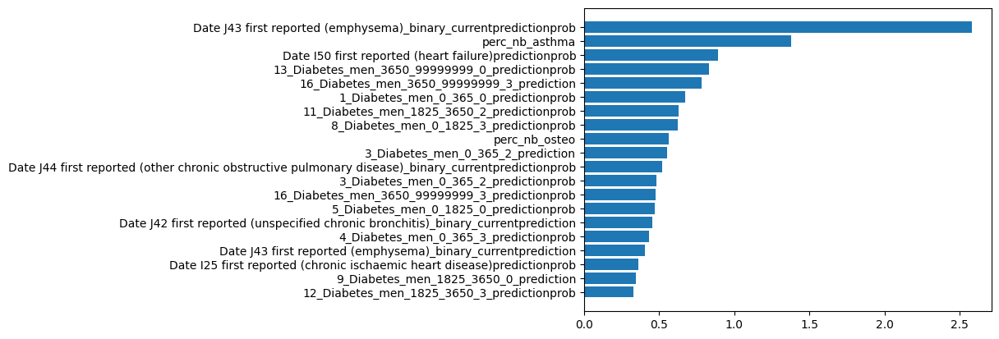

In [180]:
analysis_function(meta_col_men_current, 'Date J44 first reported (other chronic obstructive pulmonary disease)_binary', True)

#### Men past

##### Unsampled

Number of missing values: 
 1_Diabetes_men_0_365_0_prediction                                                                  0
1_Diabetes_men_0_365_0_predictionprob                                                              0
2_Diabetes_men_0_365_1_prediction                                                                  0
2_Diabetes_men_0_365_1_predictionprob                                                              0
3_Diabetes_men_0_365_2_prediction                                                                  0
3_Diabetes_men_0_365_2_predictionprob                                                              0
4_Diabetes_men_0_365_3_prediction                                                                  0
4_Diabetes_men_0_365_3_predictionprob                                                              0
5_Diabetes_men_0_1825_0_prediction                                                                 0
5_Diabetes_men_0_1825_0_predictionprob                         

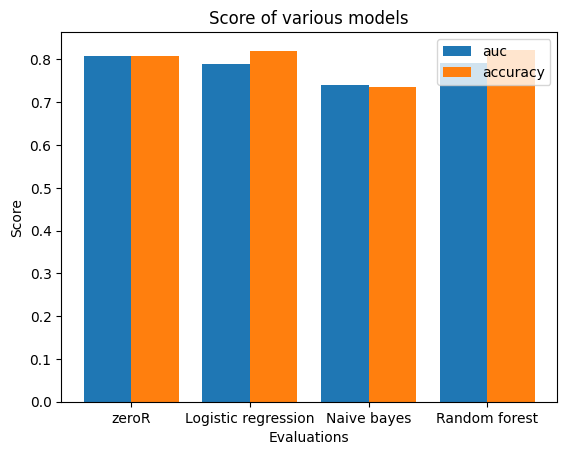

F1:  0.3403015332288259 0.41693059421165546 0.3531074018282002
auc:  [0.8090952155376598, 0.7902672584064461, 0.7414010828431457, 0.7921274912447962]
accuracy:  [0.8090952155376598, 0.8190391359394082, 0.7347282444287587, 0.8228283643126841]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


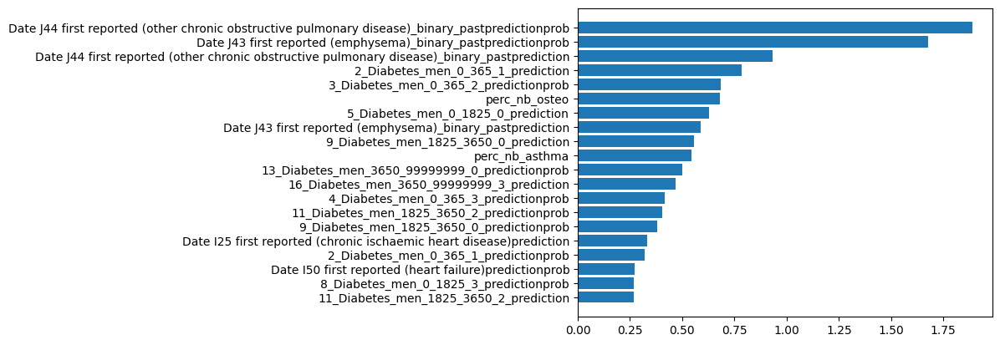

In [181]:
analysis_function(meta_col_men_past, 'Date J44 first reported (other chronic obstructive pulmonary disease)_binary', False)

##### Sampled

Number of missing values: 
 1_Diabetes_men_0_365_0_prediction                                                                  0
1_Diabetes_men_0_365_0_predictionprob                                                              0
2_Diabetes_men_0_365_1_prediction                                                                  0
2_Diabetes_men_0_365_1_predictionprob                                                              0
3_Diabetes_men_0_365_2_prediction                                                                  0
3_Diabetes_men_0_365_2_predictionprob                                                              0
4_Diabetes_men_0_365_3_prediction                                                                  0
4_Diabetes_men_0_365_3_predictionprob                                                              0
5_Diabetes_men_0_1825_0_prediction                                                                 0
5_Diabetes_men_0_1825_0_predictionprob                         

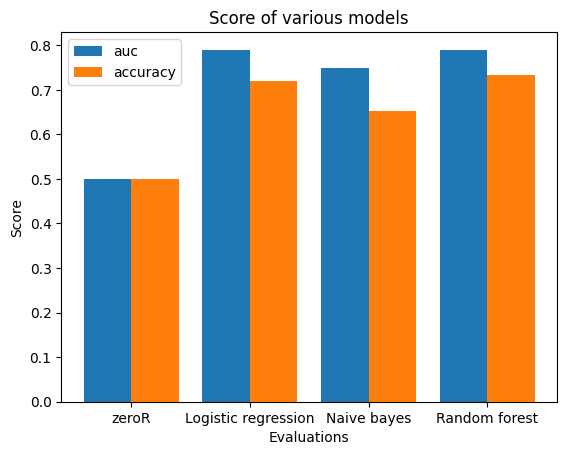

F1:  0.7267736667363643 0.5975987137076699 0.7387077766721479
auc:  [0.5, 0.7886172077427221, 0.7491415180612712, 0.7900213382106386]
accuracy:  [0.5, 0.7207422743654628, 0.6525726554712062, 0.7331723027375201]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


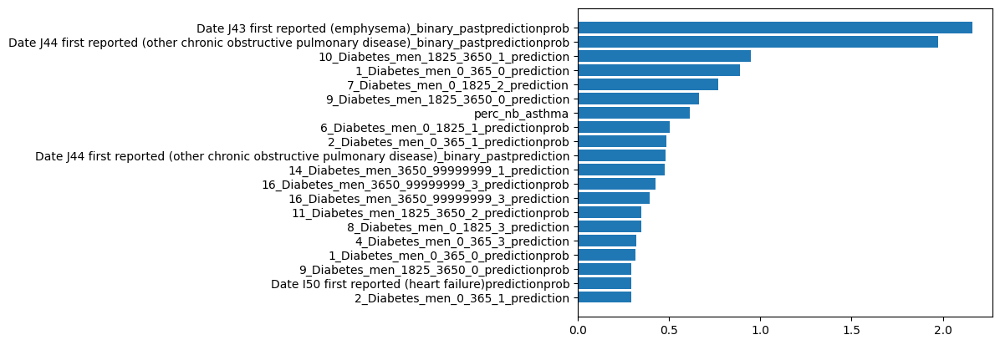

In [182]:
analysis_function(meta_col_men_past, 'Date J44 first reported (other chronic obstructive pulmonary disease)_binary', True)

#### Women current

##### Unsampled

Number of missing values: 
 perc_nb_osteo                                                                                         0
perc_linreg_osteo                                                                                     0
perc_nb_asthma                                                                                        0
perc_linreg_asthma                                                                                    0
1_Diabetes_women_0_365_0_prediction                                                                   0
1_Diabetes_women_0_365_0_predictionprob                                                               0
2_Diabetes_women_0_365_1_prediction                                                                   0
2_Diabetes_women_0_365_1_predictionprob                                                               0
3_Diabetes_women_0_365_2_prediction                                                                   0
3_Diabetes_women_0_365_2_predictionp

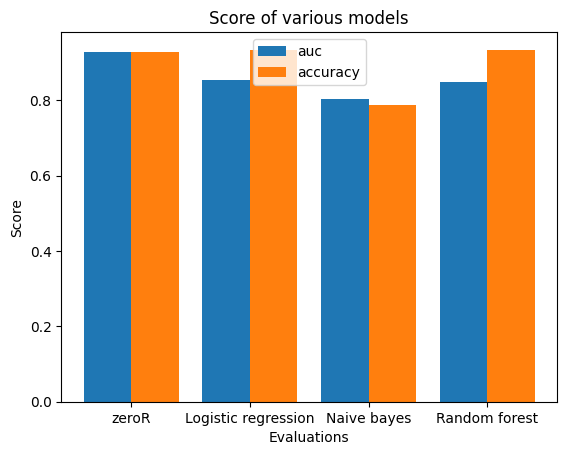

F1:  0.30100260987461136 0.303749560361228 0.28516573590908073
auc:  [0.9272179155900087, 0.8535198561083348, 0.8022185028820548, 0.846924787062393]
accuracy:  [0.9272179155900087, 0.9338212892707027, 0.7879653442453094, 0.9333913881767929]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


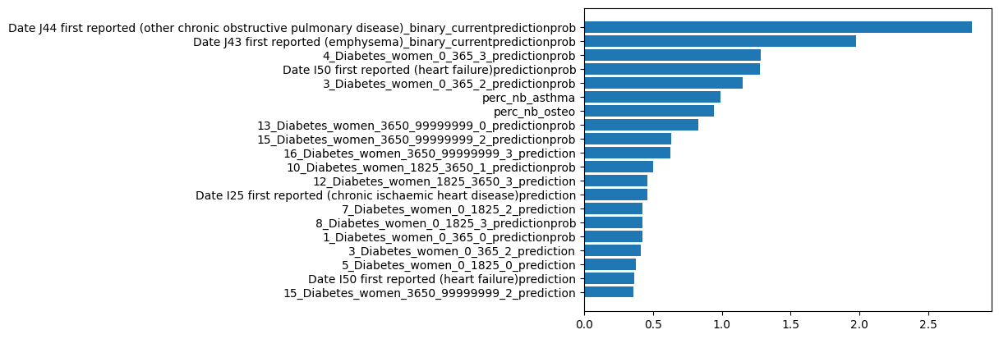

In [183]:
analysis_function(meta_col_women_current, 'Date J44 first reported (other chronic obstructive pulmonary disease)_binary', False)

##### Sampled

Number of missing values: 
 perc_nb_osteo                                                                                         0
perc_linreg_osteo                                                                                     0
perc_nb_asthma                                                                                        0
perc_linreg_asthma                                                                                    0
1_Diabetes_women_0_365_0_prediction                                                                   0
1_Diabetes_women_0_365_0_predictionprob                                                               0
2_Diabetes_women_0_365_1_prediction                                                                   0
2_Diabetes_women_0_365_1_predictionprob                                                               0
3_Diabetes_women_0_365_2_prediction                                                                   0
3_Diabetes_women_0_365_2_predictionp

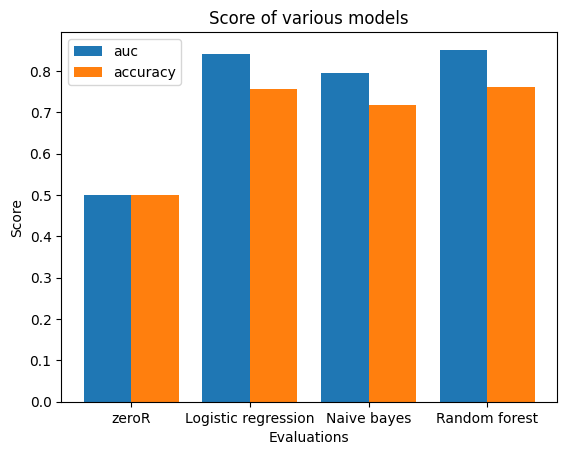

F1:  0.749711413549591 0.7111611037046577 0.7657736443346662
auc:  [0.5, 0.8419664738751103, 0.7959480135549956, 0.8511857737899591]
accuracy:  [0.5, 0.756386870214115, 0.717963224893918, 0.7603570209237672]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


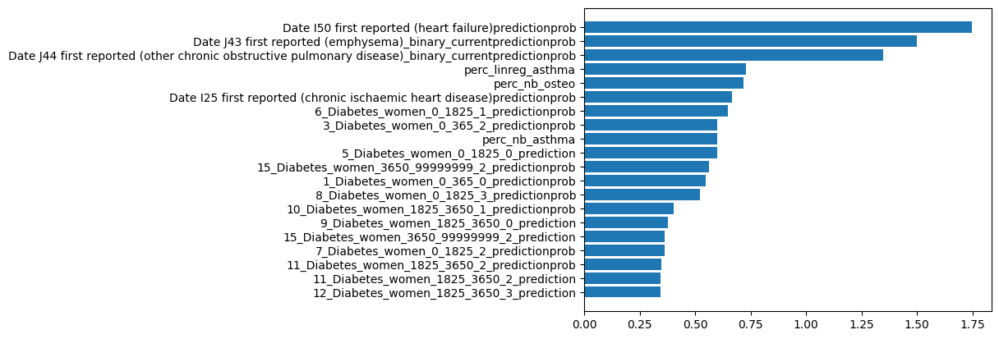

In [184]:
analysis_function(meta_col_women_current, 'Date J44 first reported (other chronic obstructive pulmonary disease)_binary', True)

#### Women past

##### Unsampled

Number of missing values: 
 perc_nb_osteo                                                                                      0
perc_linreg_osteo                                                                                  0
perc_nb_asthma                                                                                     0
perc_linreg_asthma                                                                                 0
1_Diabetes_women_0_365_0_prediction                                                                0
1_Diabetes_women_0_365_0_predictionprob                                                            0
2_Diabetes_women_0_365_1_prediction                                                                0
2_Diabetes_women_0_365_1_predictionprob                                                            0
3_Diabetes_women_0_365_2_prediction                                                                0
3_Diabetes_women_0_365_2_predictionprob                        

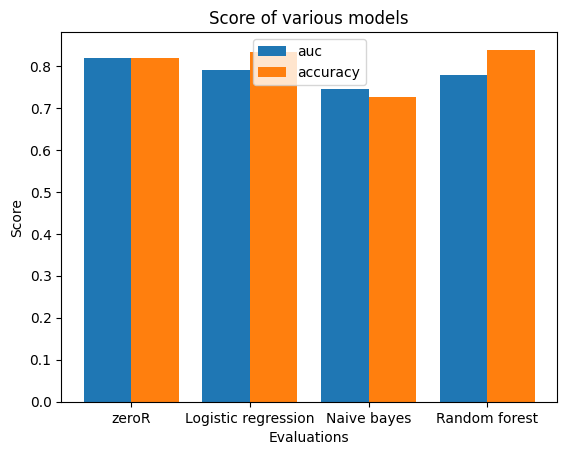

F1:  0.3583751845557736 0.41889215197135704 0.3454516994794387
auc:  [0.817621980104216, 0.7900893979104584, 0.7444612353383401, 0.7780244878686698]
accuracy:  [0.817621980104216, 0.8342027718956225, 0.7261918366889628, 0.8384659339181876]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


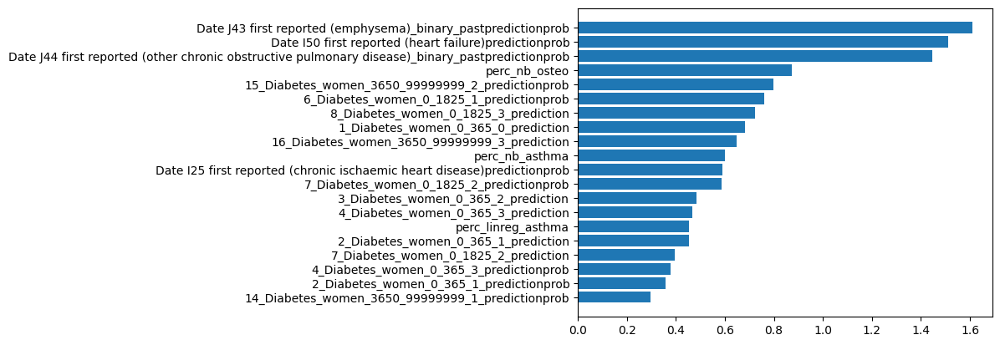

In [185]:
analysis_function(meta_col_women_past, 'Date J44 first reported (other chronic obstructive pulmonary disease)_binary', False)

##### Sampled

Number of missing values: 
 perc_nb_osteo                                                                                      0
perc_linreg_osteo                                                                                  0
perc_nb_asthma                                                                                     0
perc_linreg_asthma                                                                                 0
1_Diabetes_women_0_365_0_prediction                                                                0
1_Diabetes_women_0_365_0_predictionprob                                                            0
2_Diabetes_women_0_365_1_prediction                                                                0
2_Diabetes_women_0_365_1_predictionprob                                                            0
3_Diabetes_women_0_365_2_prediction                                                                0
3_Diabetes_women_0_365_2_predictionprob                        

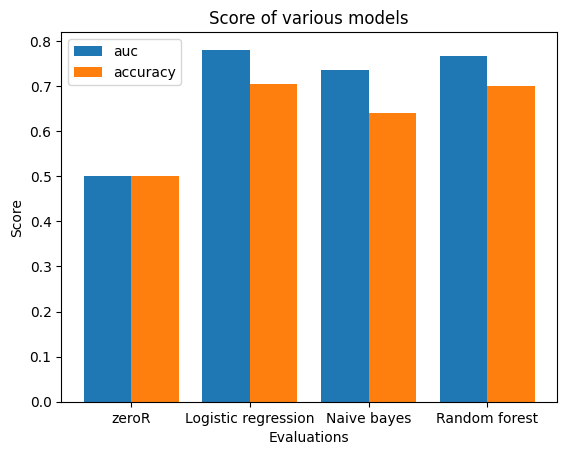

F1:  0.6990571095329997 0.6135536960974417 0.705536633423422
auc:  [0.5, 0.7803002192612583, 0.7342722212852083, 0.7660819699780738]
accuracy:  [0.5, 0.7038961038961039, 0.638961038961039, 0.7]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


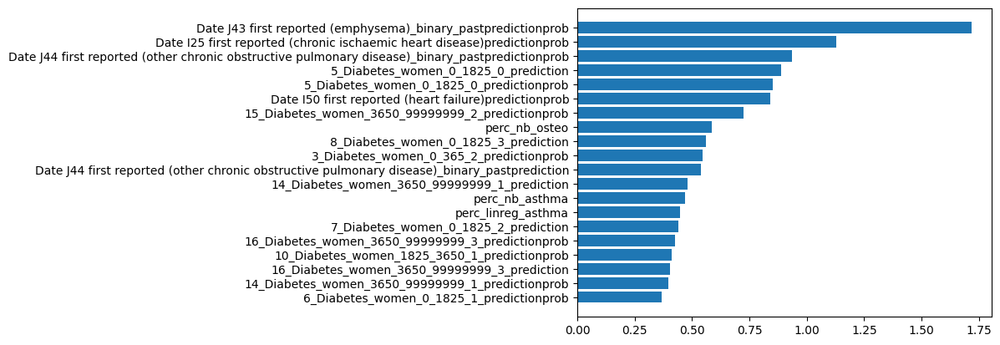

In [186]:
analysis_function(meta_col_women_past, 'Date J44 first reported (other chronic obstructive pulmonary disease)_binary', True)

### Osteoporosis

#### men current

##### Unsampled

Number of missing values: 
 1_Diabetes_men_0_365_0_prediction                                                                     0
1_Diabetes_men_0_365_0_predictionprob                                                                 0
2_Diabetes_men_0_365_1_prediction                                                                     0
2_Diabetes_men_0_365_1_predictionprob                                                                 0
3_Diabetes_men_0_365_2_prediction                                                                     0
3_Diabetes_men_0_365_2_predictionprob                                                                 0
4_Diabetes_men_0_365_3_prediction                                                                     0
4_Diabetes_men_0_365_3_predictionprob                                                                 0
5_Diabetes_men_0_1825_0_prediction                                                                    0
5_Diabetes_men_0_1825_0_predictionpr

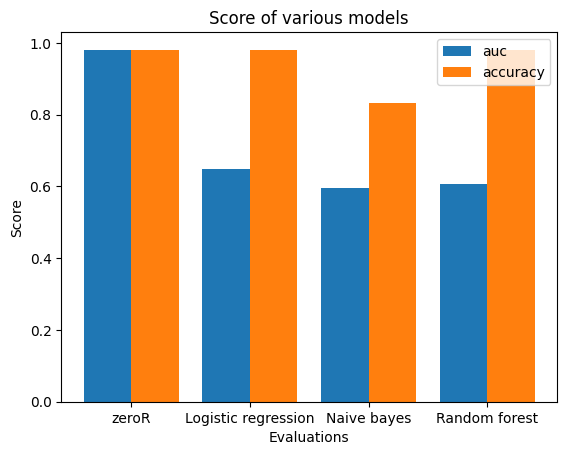

F1:  0.0 0.047212275319267846 0.0
auc:  [0.9808051850928581, 0.6471619639469636, 0.5945778180304407, 0.6071561847128888]
accuracy:  [0.9808051850928581, 0.9808052299158645, 0.8316130235159764, 0.9808052299158645]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


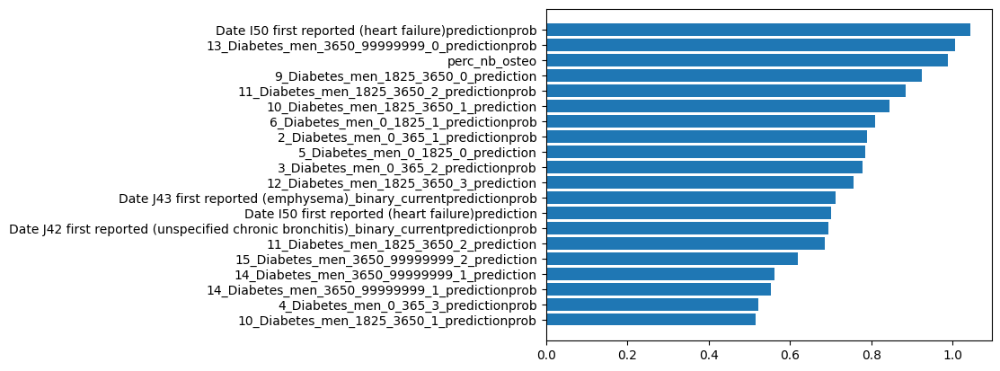

In [187]:
analysis_function(meta_col_men_current, 'Date M81 first reported (osteoporosis without pathological fracture)_binary', False)

##### Sampled

Number of missing values: 
 1_Diabetes_men_0_365_0_prediction                                                                     0
1_Diabetes_men_0_365_0_predictionprob                                                                 0
2_Diabetes_men_0_365_1_prediction                                                                     0
2_Diabetes_men_0_365_1_predictionprob                                                                 0
3_Diabetes_men_0_365_2_prediction                                                                     0
3_Diabetes_men_0_365_2_predictionprob                                                                 0
4_Diabetes_men_0_365_3_prediction                                                                     0
4_Diabetes_men_0_365_3_predictionprob                                                                 0
5_Diabetes_men_0_1825_0_prediction                                                                    0
5_Diabetes_men_0_1825_0_predictionpr

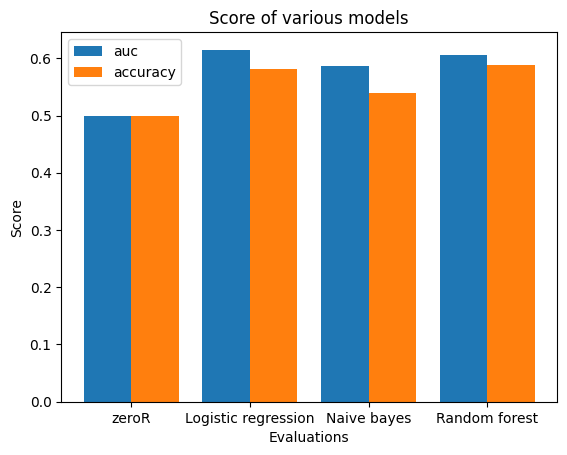

F1:  0.5702424596638507 0.4888426823720941 0.5792484721161192
auc:  [0.5, 0.61491501907735, 0.5872216441207075, 0.6049497051682275]
accuracy:  [0.5, 0.5811210999471179, 0.5388683236382866, 0.5875727128503437]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


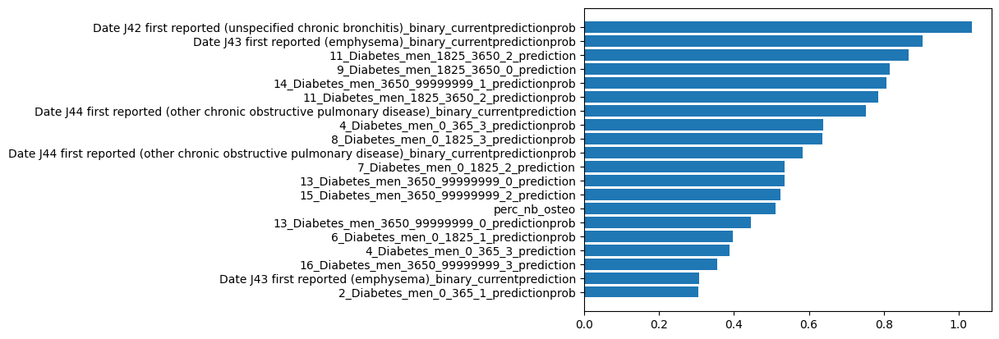

In [188]:
analysis_function(meta_col_men_current, 'Date M81 first reported (osteoporosis without pathological fracture)_binary', True)

#### Men past

##### Unsampled

Number of missing values: 
 1_Diabetes_men_0_365_0_prediction                                                                  0
1_Diabetes_men_0_365_0_predictionprob                                                              0
2_Diabetes_men_0_365_1_prediction                                                                  0
2_Diabetes_men_0_365_1_predictionprob                                                              0
3_Diabetes_men_0_365_2_prediction                                                                  0
3_Diabetes_men_0_365_2_predictionprob                                                              0
4_Diabetes_men_0_365_3_prediction                                                                  0
4_Diabetes_men_0_365_3_predictionprob                                                              0
5_Diabetes_men_0_1825_0_prediction                                                                 0
5_Diabetes_men_0_1825_0_predictionprob                         

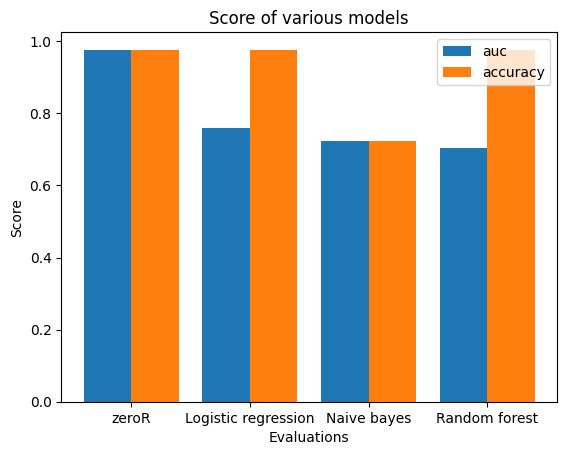

F1:  0.0 0.09603659538508486 0.0
auc:  [0.9763145428706774, 0.7604896683043795, 0.722976386374856, 0.7034930299254802]
accuracy:  [0.9763145428706774, 0.9763145216407292, 0.7244081431436478, 0.9763145216407292]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


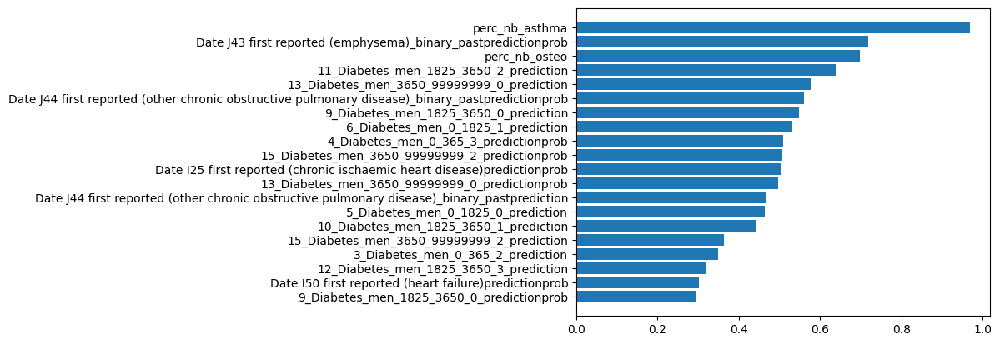

In [189]:
analysis_function(meta_col_men_past, 'Date M81 first reported (osteoporosis without pathological fracture)_binary', False)

##### Sampled

Number of missing values: 
 1_Diabetes_men_0_365_0_prediction                                                                  0
1_Diabetes_men_0_365_0_predictionprob                                                              0
2_Diabetes_men_0_365_1_prediction                                                                  0
2_Diabetes_men_0_365_1_predictionprob                                                              0
3_Diabetes_men_0_365_2_prediction                                                                  0
3_Diabetes_men_0_365_2_predictionprob                                                              0
4_Diabetes_men_0_365_3_prediction                                                                  0
4_Diabetes_men_0_365_3_predictionprob                                                              0
5_Diabetes_men_0_1825_0_prediction                                                                 0
5_Diabetes_men_0_1825_0_predictionprob                         

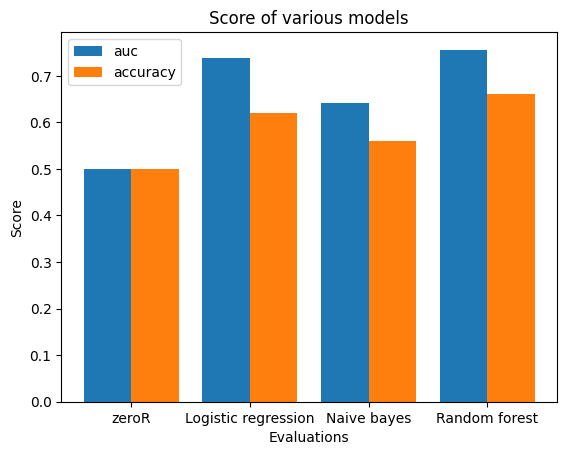

F1:  0.6053968253968254 0.5652742256322819 0.6485852311939267
auc:  [0.5, 0.738, 0.642, 0.7559999999999999]
accuracy:  [0.5, 0.62, 0.56, 0.66]
FEATURE IMPORTANCE


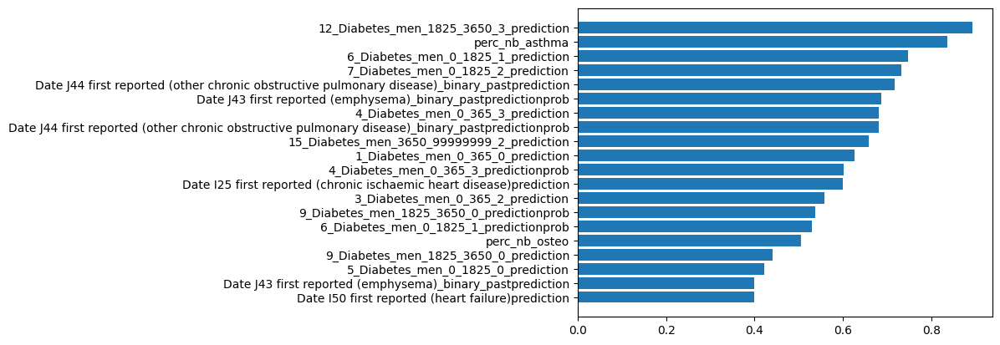

In [190]:
analysis_function(meta_col_men_past, 'Date M81 first reported (osteoporosis without pathological fracture)_binary', True)

#### Women current

##### Unsampled

Number of missing values: 
 perc_nb_osteo                                                                                         0
perc_linreg_osteo                                                                                     0
perc_nb_asthma                                                                                        0
perc_linreg_asthma                                                                                    0
1_Diabetes_women_0_365_0_prediction                                                                   0
1_Diabetes_women_0_365_0_predictionprob                                                               0
2_Diabetes_women_0_365_1_prediction                                                                   0
2_Diabetes_women_0_365_1_predictionprob                                                               0
3_Diabetes_women_0_365_2_prediction                                                                   0
3_Diabetes_women_0_365_2_predictionp

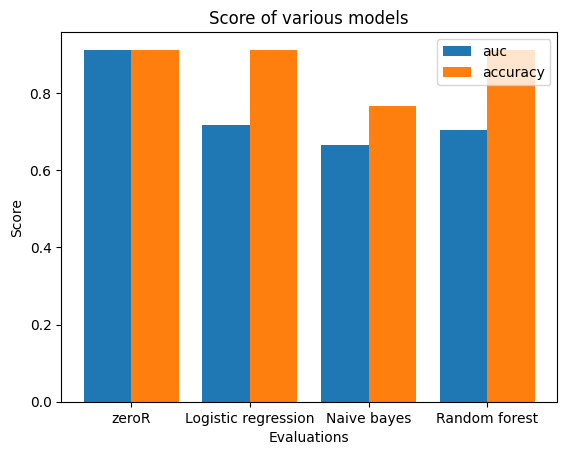

F1:  0.0 0.21785376779703627 0.0064
auc:  [0.9122882572494976, 0.7179486243792543, 0.6651844900644515, 0.7046026593296592]
accuracy:  [0.9122882572494976, 0.9114271912956873, 0.7658596322460839, 0.912144860395439]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


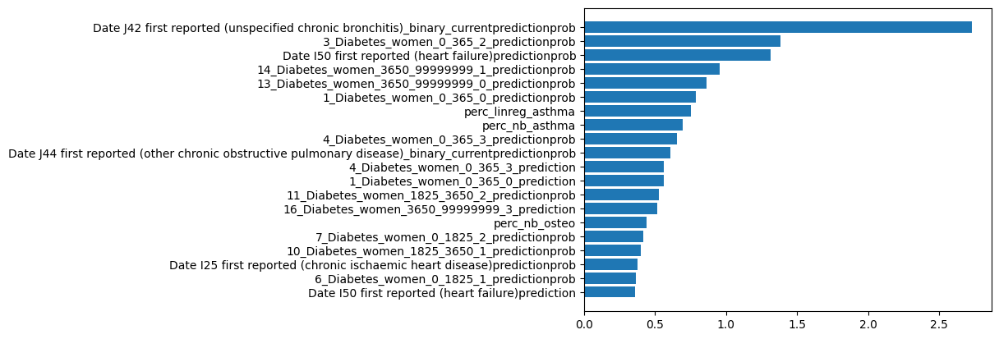

In [191]:
analysis_function(meta_col_women_current, 'Date M81 first reported (osteoporosis without pathological fracture)_binary', False)

##### Sampled

Number of missing values: 
 perc_nb_osteo                                                                                         0
perc_linreg_osteo                                                                                     0
perc_nb_asthma                                                                                        0
perc_linreg_asthma                                                                                    0
1_Diabetes_women_0_365_0_prediction                                                                   0
1_Diabetes_women_0_365_0_predictionprob                                                               0
2_Diabetes_women_0_365_1_prediction                                                                   0
2_Diabetes_women_0_365_1_predictionprob                                                               0
3_Diabetes_women_0_365_2_prediction                                                                   0
3_Diabetes_women_0_365_2_predictionp

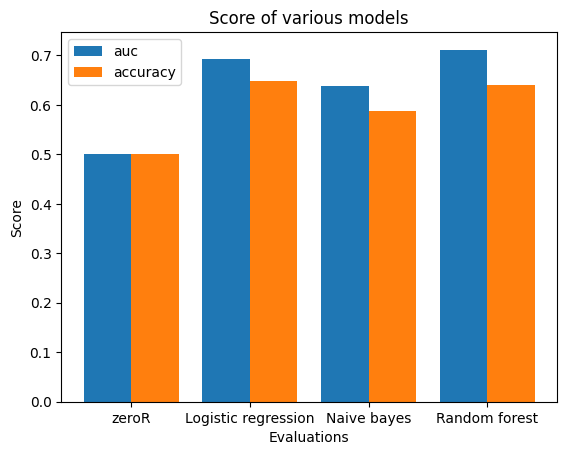

F1:  0.6416280535549591 0.529722338484015 0.6392395537903618
auc:  [0.5, 0.6932191058003028, 0.6391065431750796, 0.7115139190225549]
accuracy:  [0.5, 0.6473803947808632, 0.5875376380060221, 0.6399297423887588]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


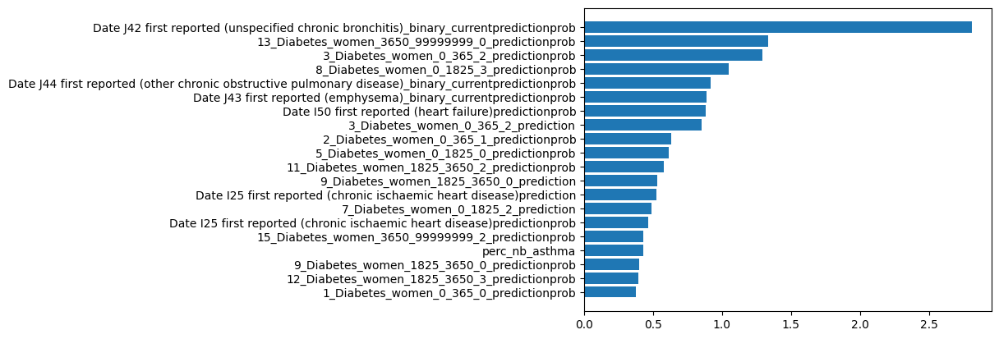

In [192]:
analysis_function(meta_col_women_current, 'Date M81 first reported (osteoporosis without pathological fracture)_binary', True)

#### Women past

##### Unsampled

Number of missing values: 
 perc_nb_osteo                                                                                      0
perc_linreg_osteo                                                                                  0
perc_nb_asthma                                                                                     0
perc_linreg_asthma                                                                                 0
1_Diabetes_women_0_365_0_prediction                                                                0
1_Diabetes_women_0_365_0_predictionprob                                                            0
2_Diabetes_women_0_365_1_prediction                                                                0
2_Diabetes_women_0_365_1_predictionprob                                                            0
3_Diabetes_women_0_365_2_prediction                                                                0
3_Diabetes_women_0_365_2_predictionprob                        

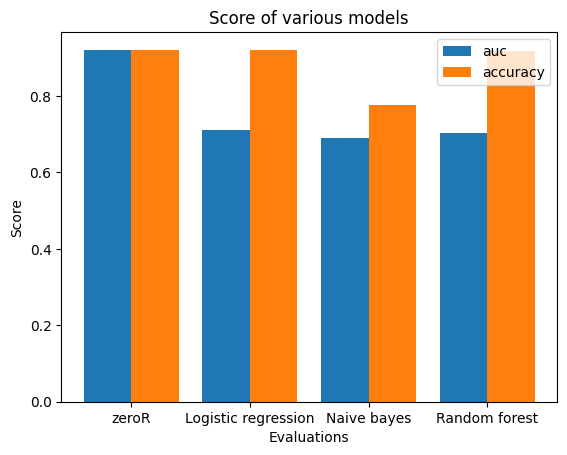

F1:  0.03366795366795367 0.2529165943933871 0.010526315789473684
auc:  [0.9204168640454761, 0.7098726578856703, 0.6891733988126443, 0.7040139766403523]
accuracy:  [0.9204168640454761, 0.9208911745263464, 0.7764086361242759, 0.9180475726306119]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


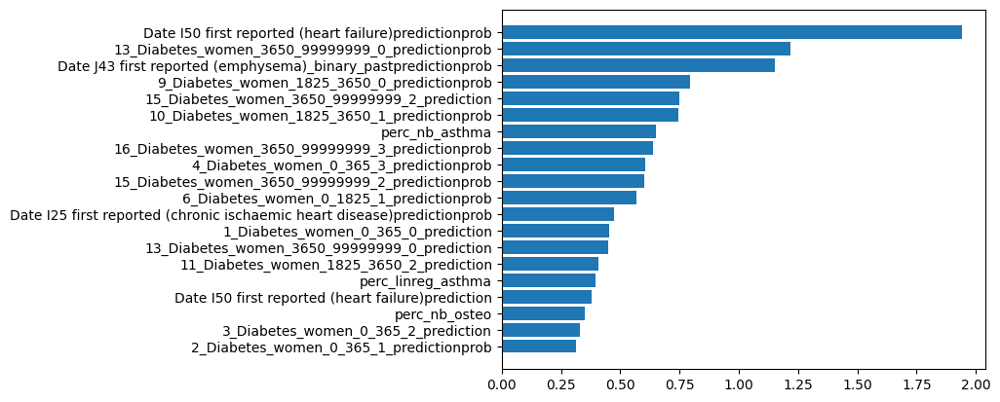

In [193]:
analysis_function(meta_col_women_past, 'Date M81 first reported (osteoporosis without pathological fracture)_binary', False)

##### Sampled

Number of missing values: 
 perc_nb_osteo                                                                                      0
perc_linreg_osteo                                                                                  0
perc_nb_asthma                                                                                     0
perc_linreg_asthma                                                                                 0
1_Diabetes_women_0_365_0_prediction                                                                0
1_Diabetes_women_0_365_0_predictionprob                                                            0
2_Diabetes_women_0_365_1_prediction                                                                0
2_Diabetes_women_0_365_1_predictionprob                                                            0
3_Diabetes_women_0_365_2_prediction                                                                0
3_Diabetes_women_0_365_2_predictionprob                        

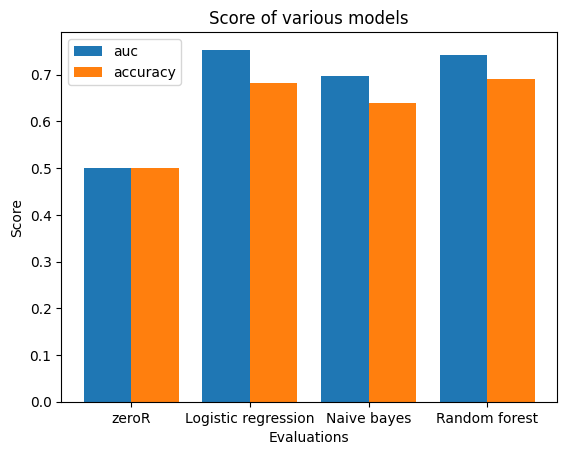

F1:  0.6588376402922698 0.6295003350861862 0.6774096120431986
auc:  [0.5, 0.7534602076124567, 0.6962566844919785, 0.742867253853413]
accuracy:  [0.5, 0.6814310798946445, 0.6398156277436348, 0.6903863037752415]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


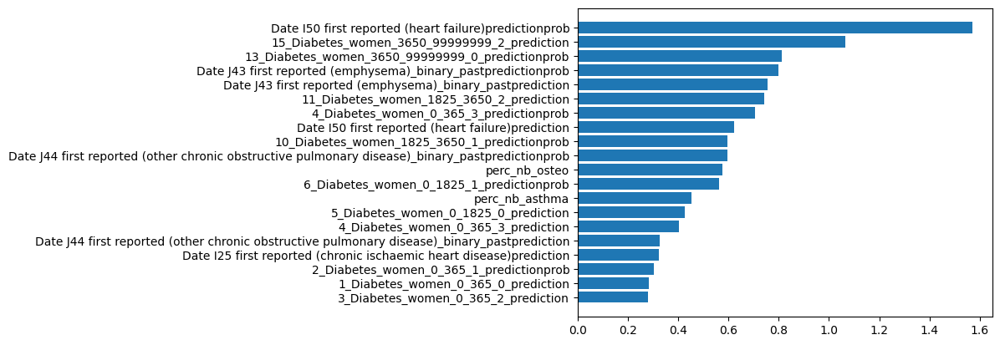

In [194]:
analysis_function(meta_col_women_past, 'Date M81 first reported (osteoporosis without pathological fracture)_binary', True)

### Asthma

In [195]:
#Data label
def asthma_label(l):
    if l[0] == 1 and l[1] == 1:
        return 1
    return 0

df["all_asthma_binary_assesment"] = df[['all_asthma_binary','binary_assesment'] ].apply(asthma_label, axis=1)

In [196]:
df["all_asthma_binary_assesment"].value_counts()

0    97492
1     2971
Name: all_asthma_binary_assesment, dtype: int64

#### Men current

##### Unsampled

Number of missing values: 
 1_Diabetes_men_0_365_0_prediction                                                                     0
1_Diabetes_men_0_365_0_predictionprob                                                                 0
2_Diabetes_men_0_365_1_prediction                                                                     0
2_Diabetes_men_0_365_1_predictionprob                                                                 0
3_Diabetes_men_0_365_2_prediction                                                                     0
3_Diabetes_men_0_365_2_predictionprob                                                                 0
4_Diabetes_men_0_365_3_prediction                                                                     0
4_Diabetes_men_0_365_3_predictionprob                                                                 0
5_Diabetes_men_0_1825_0_prediction                                                                    0
5_Diabetes_men_0_1825_0_predictionpr

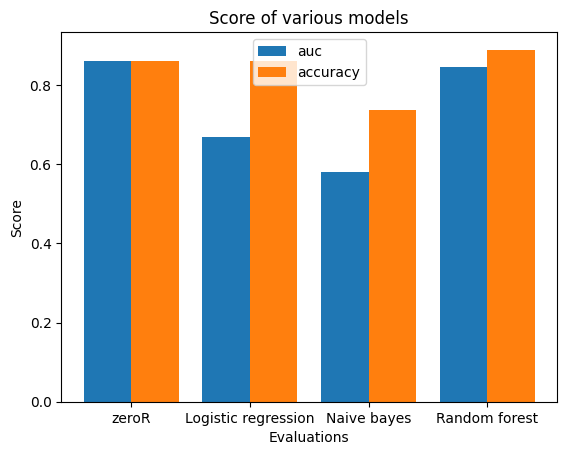

F1:  0.01753700593077988 0.21826988547402298 0.36443601365750844
auc:  [0.8604013461298766, 0.6692679450333796, 0.5787963074361754, 0.8453008191340479]
accuracy:  [0.8604013461298766, 0.8607755533285167, 0.7356365317236504, 0.8886946185937027]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


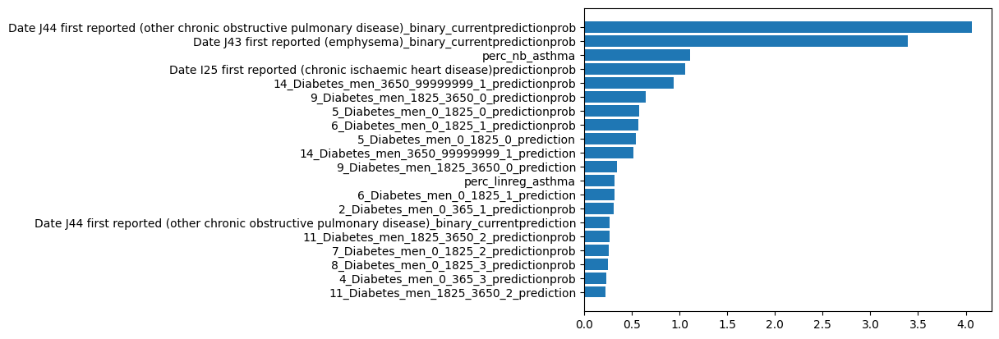

In [197]:
analysis_function(meta_col_men_current,'all_asthma_binary', False)

#### Sampled

Number of missing values: 
 1_Diabetes_men_0_365_0_prediction                                                                     0
1_Diabetes_men_0_365_0_predictionprob                                                                 0
2_Diabetes_men_0_365_1_prediction                                                                     0
2_Diabetes_men_0_365_1_predictionprob                                                                 0
3_Diabetes_men_0_365_2_prediction                                                                     0
3_Diabetes_men_0_365_2_predictionprob                                                                 0
4_Diabetes_men_0_365_3_prediction                                                                     0
4_Diabetes_men_0_365_3_predictionprob                                                                 0
5_Diabetes_men_0_1825_0_prediction                                                                    0
5_Diabetes_men_0_1825_0_predictionpr

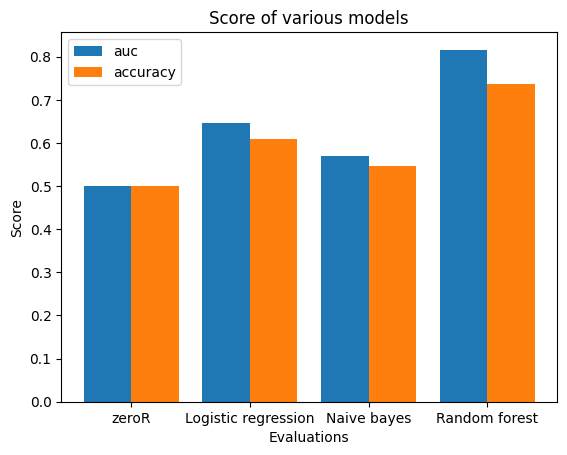

F1:  0.5831356917500539 0.4927333058685941 0.7527441966517147
auc:  [0.5, 0.647265625, 0.5690648915816326, 0.8162667410714286]
accuracy:  [0.5, 0.609375, 0.5477678571428571, 0.7370535714285714]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


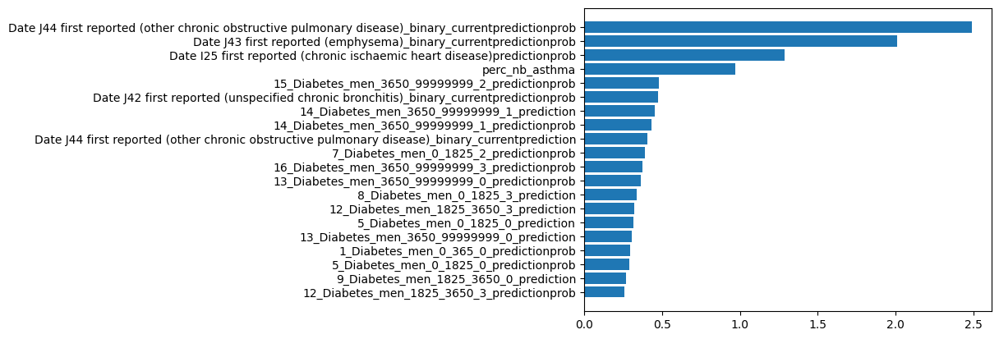

In [198]:
analysis_function(meta_col_men_current,'all_asthma_binary', True)

#### Men past

##### Unsampled

Number of missing values: 
 1_Diabetes_men_0_365_0_prediction                                                                  0
1_Diabetes_men_0_365_0_predictionprob                                                              0
2_Diabetes_men_0_365_1_prediction                                                                  0
2_Diabetes_men_0_365_1_predictionprob                                                              0
3_Diabetes_men_0_365_2_prediction                                                                  0
3_Diabetes_men_0_365_2_predictionprob                                                              0
4_Diabetes_men_0_365_3_prediction                                                                  0
4_Diabetes_men_0_365_3_predictionprob                                                              0
5_Diabetes_men_0_1825_0_prediction                                                                 0
5_Diabetes_men_0_1825_0_predictionprob                         

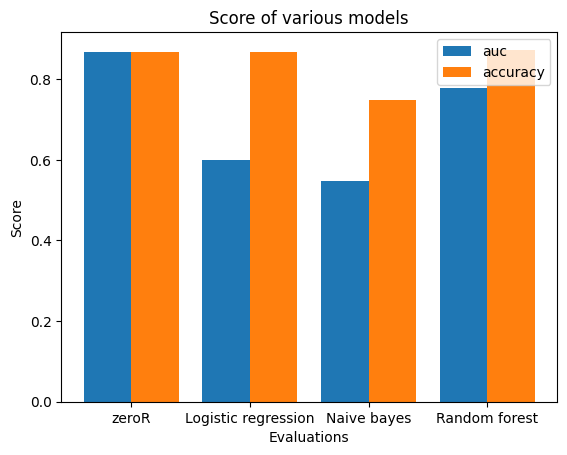

F1:  0.0 0.187916833342046 0.09982964519006647
auc:  [0.8683088583609664, 0.5986313804567702, 0.5486380512847883, 0.7788331540297525]
accuracy:  [0.8683088583609664, 0.8683091884866615, 0.7484678386160689, 0.8730462841585157]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


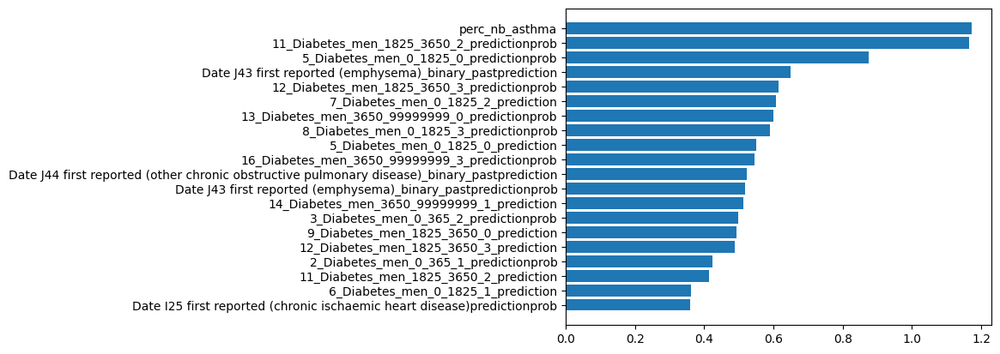

In [199]:
analysis_function(meta_col_men_past,'all_asthma_binary', False)

##### Sampled

Number of missing values: 
 1_Diabetes_men_0_365_0_prediction                                                                  0
1_Diabetes_men_0_365_0_predictionprob                                                              0
2_Diabetes_men_0_365_1_prediction                                                                  0
2_Diabetes_men_0_365_1_predictionprob                                                              0
3_Diabetes_men_0_365_2_prediction                                                                  0
3_Diabetes_men_0_365_2_predictionprob                                                              0
4_Diabetes_men_0_365_3_prediction                                                                  0
4_Diabetes_men_0_365_3_predictionprob                                                              0
5_Diabetes_men_0_1825_0_prediction                                                                 0
5_Diabetes_men_0_1825_0_predictionprob                         

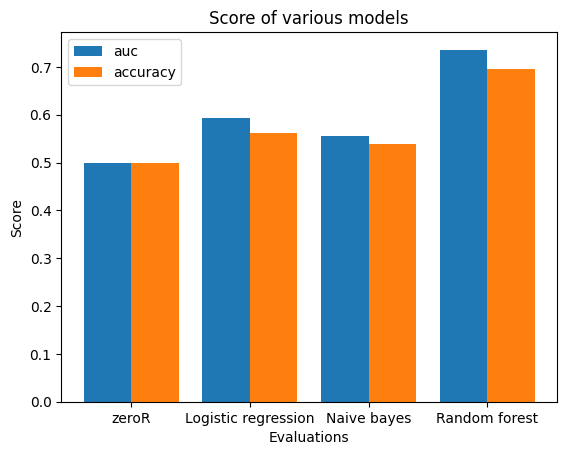

F1:  0.5274459837846044 0.4418746026119298 0.7113281653402447
auc:  [0.5, 0.5934206864564008, 0.5544283395176253, 0.7357583487940631]
accuracy:  [0.5, 0.5611486486486487, 0.5395109395109395, 0.695978120978121]
FEATURE IMPORTANCE


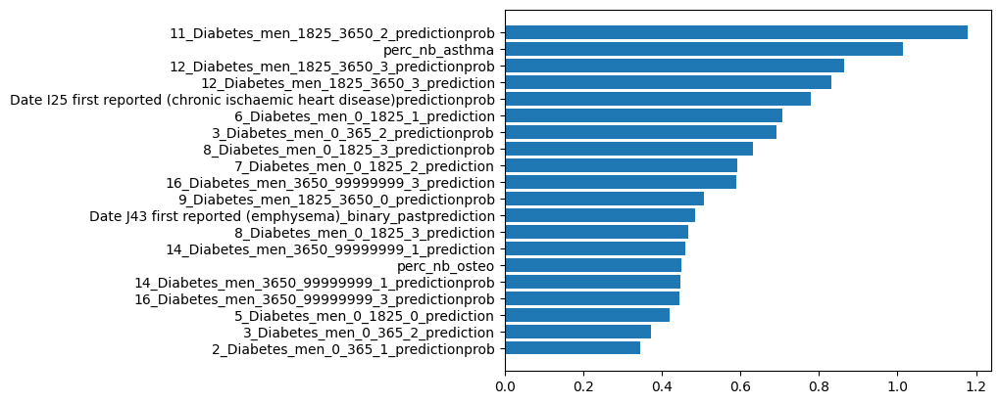

In [200]:
analysis_function(meta_col_men_past,'all_asthma_binary', True)

#### Women current

##### Unsampled

Number of missing values: 
 perc_nb_osteo                                                                                         0
perc_linreg_osteo                                                                                     0
perc_nb_asthma                                                                                        0
perc_linreg_asthma                                                                                    0
1_Diabetes_women_0_365_0_prediction                                                                   0
1_Diabetes_women_0_365_0_predictionprob                                                               0
2_Diabetes_women_0_365_1_prediction                                                                   0
2_Diabetes_women_0_365_1_predictionprob                                                               0
3_Diabetes_women_0_365_2_prediction                                                                   0
3_Diabetes_women_0_365_2_predictionp

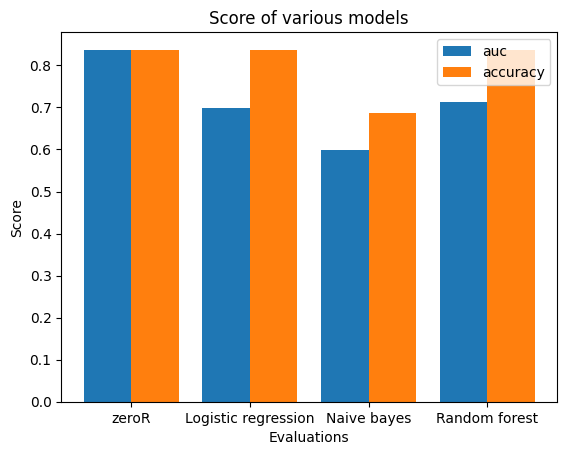

F1:  0.07049229892321228 0.27512671162520935 0.04052219478203611
auc:  [0.8354866494401378, 0.6996711613580505, 0.5996665583608503, 0.7130618380540967]
accuracy:  [0.8354866494401378, 0.8372094125062698, 0.6860428397367037, 0.8369228804403243]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


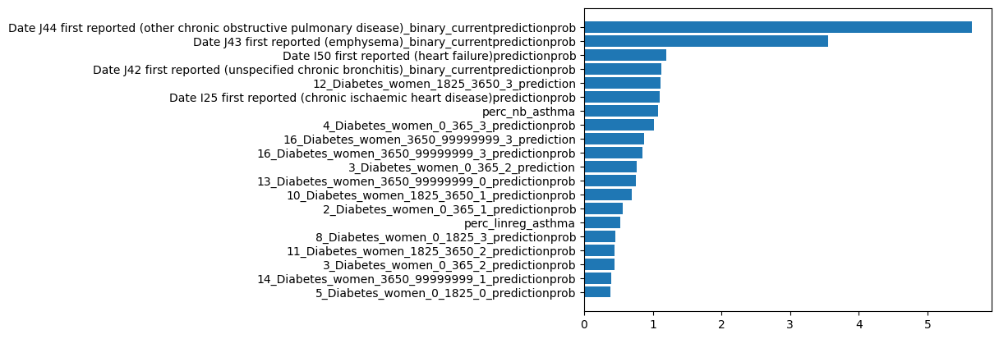

In [201]:
analysis_function(meta_col_women_current,'all_asthma_binary', False)

##### Sampled

Number of missing values: 
 perc_nb_osteo                                                                                         0
perc_linreg_osteo                                                                                     0
perc_nb_asthma                                                                                        0
perc_linreg_asthma                                                                                    0
1_Diabetes_women_0_365_0_prediction                                                                   0
1_Diabetes_women_0_365_0_predictionprob                                                               0
2_Diabetes_women_0_365_1_prediction                                                                   0
2_Diabetes_women_0_365_1_predictionprob                                                               0
3_Diabetes_women_0_365_2_prediction                                                                   0
3_Diabetes_women_0_365_2_predictionp

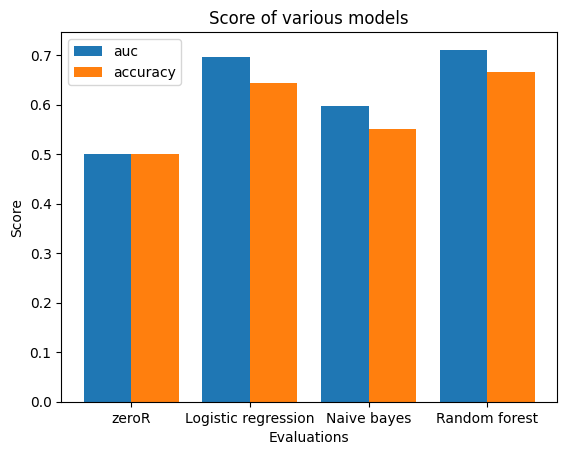

F1:  0.6154618866276635 0.47668160942480664 0.6806639814846331
auc:  [0.5, 0.6958357508189327, 0.5984666743495589, 0.7111689658688894]
accuracy:  [0.5, 0.6439811247157766, 0.5510355719192092, 0.6662309368191721]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


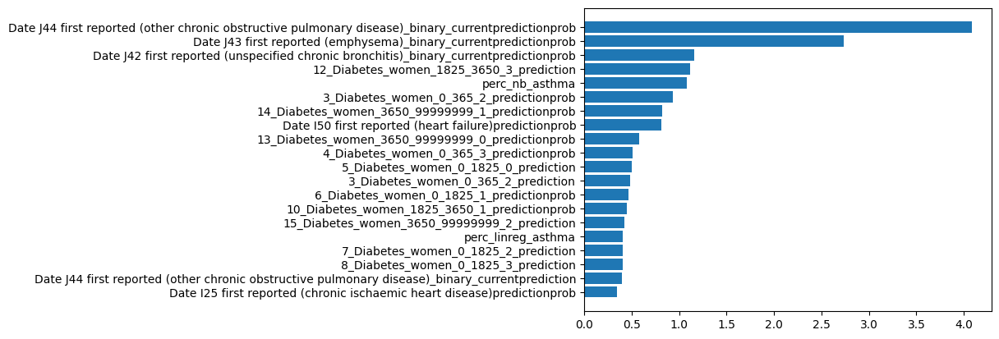

In [202]:
analysis_function(meta_col_women_current,'all_asthma_binary', True)

#### Women past

##### Unsampled

Number of missing values: 
 perc_nb_osteo                                                                                      0
perc_linreg_osteo                                                                                  0
perc_nb_asthma                                                                                     0
perc_linreg_asthma                                                                                 0
1_Diabetes_women_0_365_0_prediction                                                                0
1_Diabetes_women_0_365_0_predictionprob                                                            0
2_Diabetes_women_0_365_1_prediction                                                                0
2_Diabetes_women_0_365_1_predictionprob                                                            0
3_Diabetes_women_0_365_2_prediction                                                                0
3_Diabetes_women_0_365_2_predictionprob                        

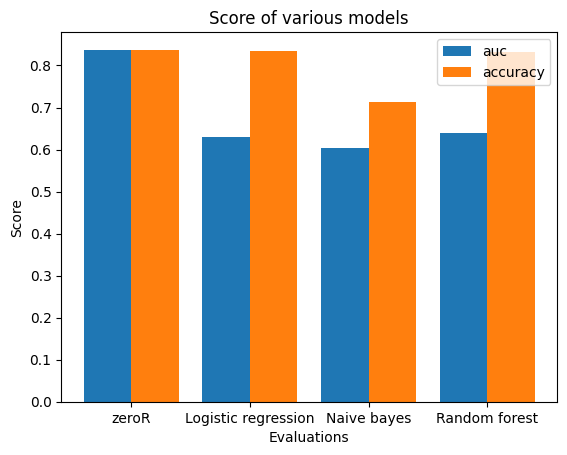

F1:  0.03890948027345359 0.3026578697046114 0.04311095089321477
auc:  [0.837517764092847, 0.6303923277586873, 0.6044972283679951, 0.639398310419701]
accuracy:  [0.837517764092847, 0.8356223320224531, 0.713397868979194, 0.8318308628281402]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


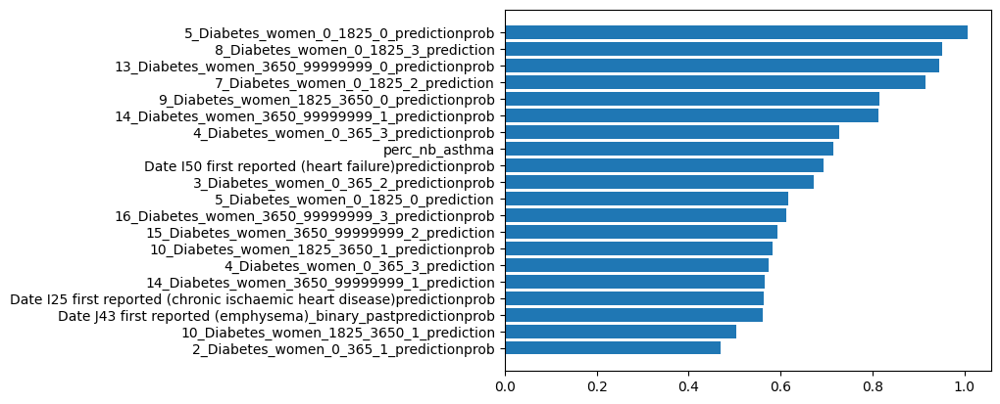

In [203]:
analysis_function(meta_col_women_past,'all_asthma_binary', False)

##### Sampled

Number of missing values: 
 perc_nb_osteo                                                                                      0
perc_linreg_osteo                                                                                  0
perc_nb_asthma                                                                                     0
perc_linreg_asthma                                                                                 0
1_Diabetes_women_0_365_0_prediction                                                                0
1_Diabetes_women_0_365_0_predictionprob                                                            0
2_Diabetes_women_0_365_1_prediction                                                                0
2_Diabetes_women_0_365_1_predictionprob                                                            0
3_Diabetes_women_0_365_2_prediction                                                                0
3_Diabetes_women_0_365_2_predictionprob                        

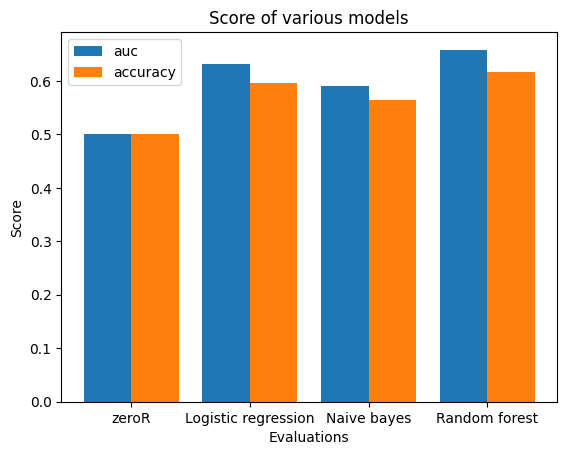

F1:  0.5535251272788644 0.45397854358031353 0.6163802323218699
auc:  [0.5, 0.6310729332690859, 0.5913469735720376, 0.6583172714580476]
accuracy:  [0.5, 0.5961811065270285, 0.5641172114672591, 0.6167354279064847]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


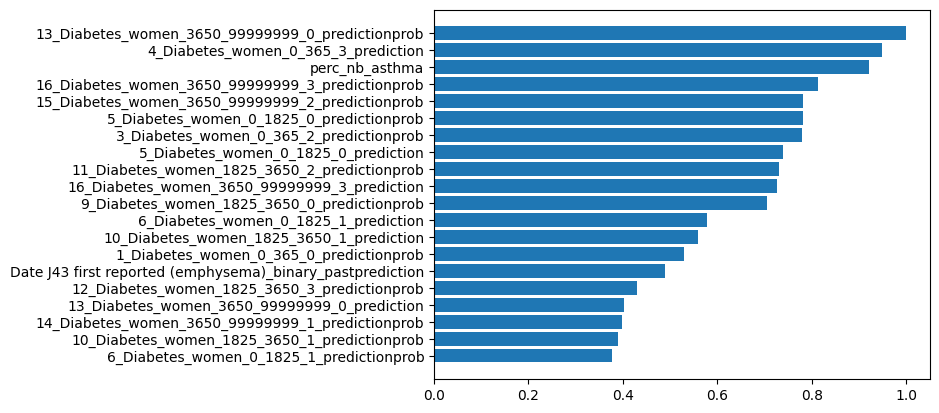

In [204]:
analysis_function(meta_col_women_past,'all_asthma_binary', True)

### CVD heart failure

#### Men current

##### Unsampled

Number of missing values: 
 1_Diabetes_men_0_365_0_prediction                                                                     0
1_Diabetes_men_0_365_0_predictionprob                                                                 0
2_Diabetes_men_0_365_1_prediction                                                                     0
2_Diabetes_men_0_365_1_predictionprob                                                                 0
3_Diabetes_men_0_365_2_prediction                                                                     0
3_Diabetes_men_0_365_2_predictionprob                                                                 0
4_Diabetes_men_0_365_3_prediction                                                                     0
4_Diabetes_men_0_365_3_predictionprob                                                                 0
5_Diabetes_men_0_1825_0_prediction                                                                    0
5_Diabetes_men_0_1825_0_predictionpr

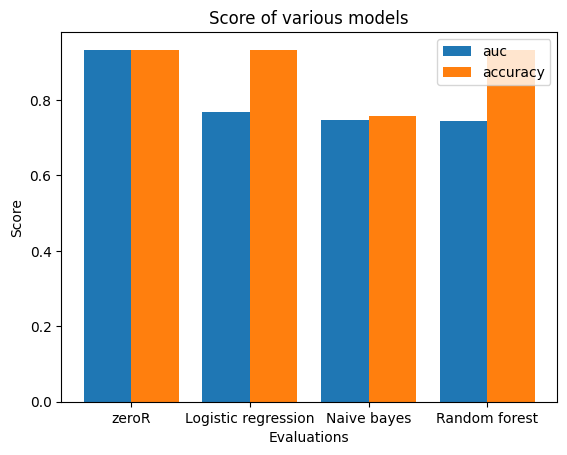

F1:  0.0 0.23579765729735724 0.017958918567833076
auc:  [0.9335659977564502, 0.7683065930027435, 0.7459135250927647, 0.7441502559457988]
accuracy:  [0.9335659977564502, 0.9326934222077206, 0.7581922141686283, 0.9330674093582244]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


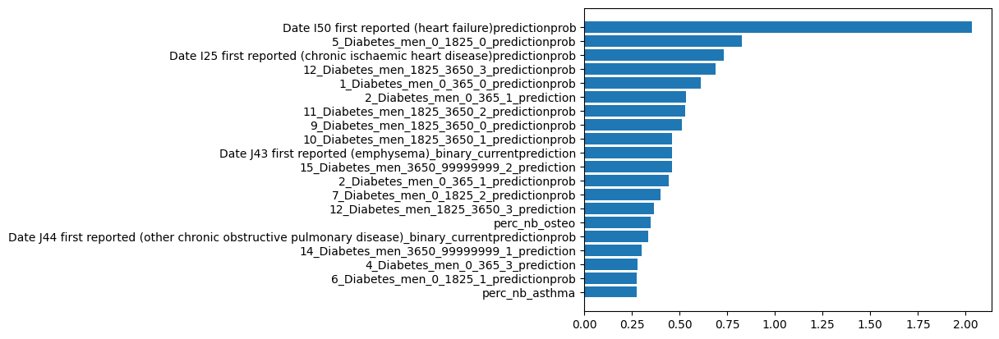

In [209]:
analysis_function(meta_col_men_current,'Date I50 first reported (heart failure)_binary', False)

##### Sampled

Number of missing values: 
 1_Diabetes_men_0_365_0_prediction                                                                     0
1_Diabetes_men_0_365_0_predictionprob                                                                 0
2_Diabetes_men_0_365_1_prediction                                                                     0
2_Diabetes_men_0_365_1_predictionprob                                                                 0
3_Diabetes_men_0_365_2_prediction                                                                     0
3_Diabetes_men_0_365_2_predictionprob                                                                 0
4_Diabetes_men_0_365_3_prediction                                                                     0
4_Diabetes_men_0_365_3_predictionprob                                                                 0
5_Diabetes_men_0_1825_0_prediction                                                                    0
5_Diabetes_men_0_1825_0_predictionpr

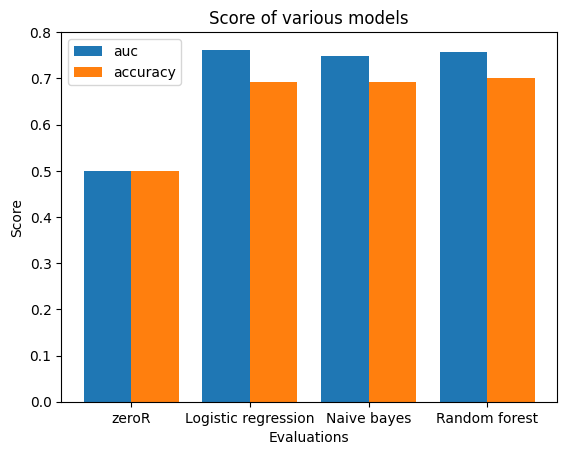

F1:  0.6902188453165075 0.6790560264246657 0.6984642924762539
auc:  [0.5, 0.7621497799099205, 0.7487405178338061, 0.7580489026807977]
accuracy:  [0.5, 0.6932210082927471, 0.6923039796410864, 0.7007590715633364]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


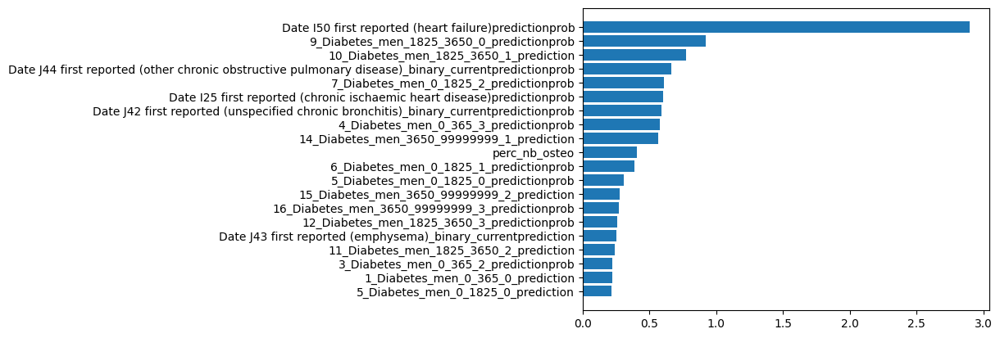

In [210]:
analysis_function(meta_col_men_current,'Date I50 first reported (heart failure)_binary', True)

#### Men past

##### Unsampled

Number of missing values: 
 1_Diabetes_men_0_365_0_prediction                                                                  0
1_Diabetes_men_0_365_0_predictionprob                                                              0
2_Diabetes_men_0_365_1_prediction                                                                  0
2_Diabetes_men_0_365_1_predictionprob                                                              0
3_Diabetes_men_0_365_2_prediction                                                                  0
3_Diabetes_men_0_365_2_predictionprob                                                              0
4_Diabetes_men_0_365_3_prediction                                                                  0
4_Diabetes_men_0_365_3_predictionprob                                                              0
5_Diabetes_men_0_1825_0_prediction                                                                 0
5_Diabetes_men_0_1825_0_predictionprob                         

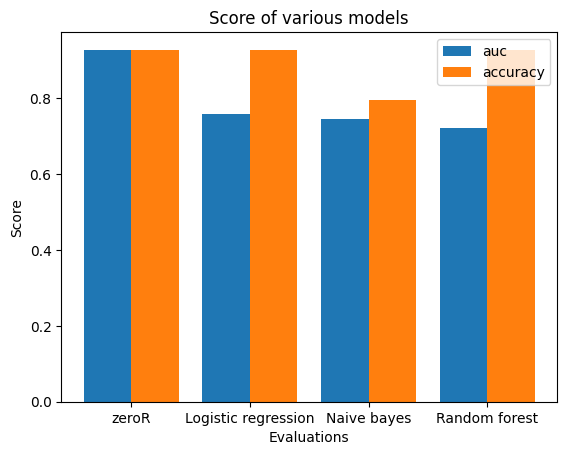

F1:  0.060361208999728924 0.2551215572086716 0.036789143810016675
auc:  [0.9284699194694458, 0.7599637919684002, 0.7465229317533465, 0.7217607526881721]
accuracy:  [0.9284699194694458, 0.9279990588551645, 0.7958522402608316, 0.927524004795357]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


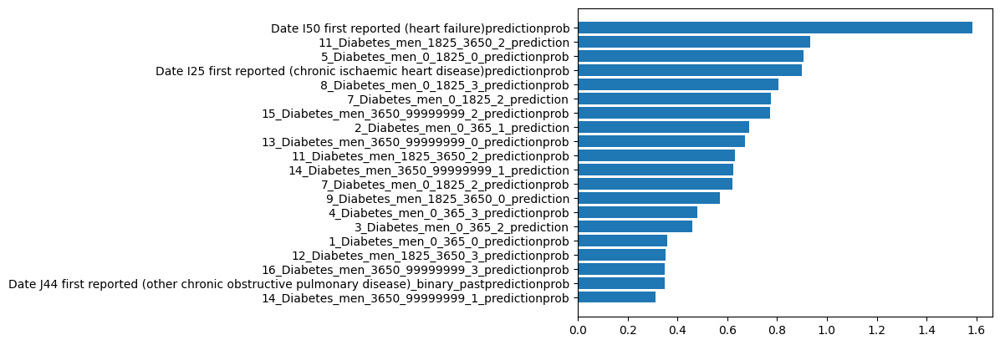

In [214]:
analysis_function(meta_col_men_past,'Date I50 first reported (heart failure)_binary', False)

#### Sampled

Number of missing values: 
 1_Diabetes_men_0_365_0_prediction                                                                  0
1_Diabetes_men_0_365_0_predictionprob                                                              0
2_Diabetes_men_0_365_1_prediction                                                                  0
2_Diabetes_men_0_365_1_predictionprob                                                              0
3_Diabetes_men_0_365_2_prediction                                                                  0
3_Diabetes_men_0_365_2_predictionprob                                                              0
4_Diabetes_men_0_365_3_prediction                                                                  0
4_Diabetes_men_0_365_3_predictionprob                                                              0
5_Diabetes_men_0_1825_0_prediction                                                                 0
5_Diabetes_men_0_1825_0_predictionprob                         

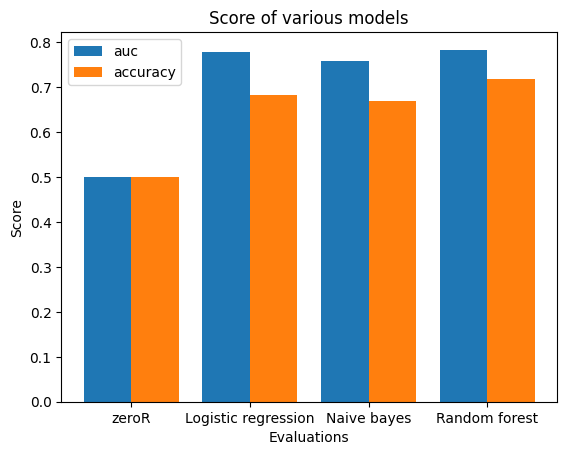

F1:  0.6690997138454766 0.6056942928114643 0.704025974025974
auc:  [0.5, 0.7786666666666667, 0.7591254480286739, 0.783415770609319]
accuracy:  [0.5, 0.6821311475409836, 0.6689071038251366, 0.7185245901639344]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


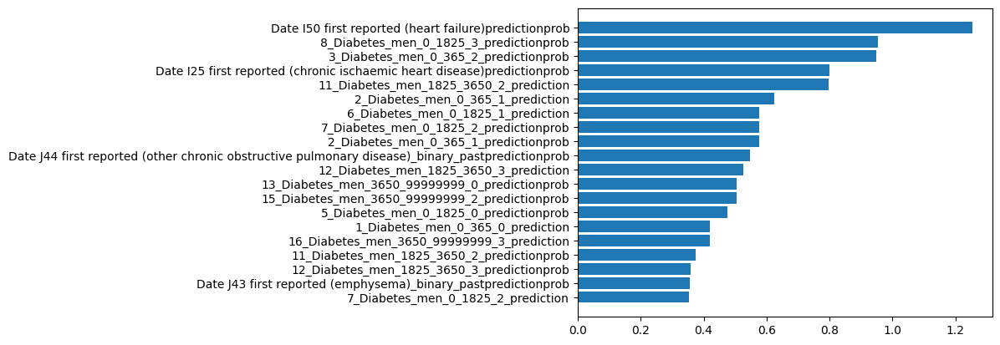

In [213]:
analysis_function(meta_col_men_past,'Date I50 first reported (heart failure)_binary', True)

#### Women current

##### Unsampled

Number of missing values: 
 perc_nb_osteo                                                                                         0
perc_linreg_osteo                                                                                     0
perc_nb_asthma                                                                                        0
perc_linreg_asthma                                                                                    0
1_Diabetes_women_0_365_0_prediction                                                                   0
1_Diabetes_women_0_365_0_predictionprob                                                               0
2_Diabetes_women_0_365_1_prediction                                                                   0
2_Diabetes_women_0_365_1_predictionprob                                                               0
3_Diabetes_women_0_365_2_prediction                                                                   0
3_Diabetes_women_0_365_2_predictionp

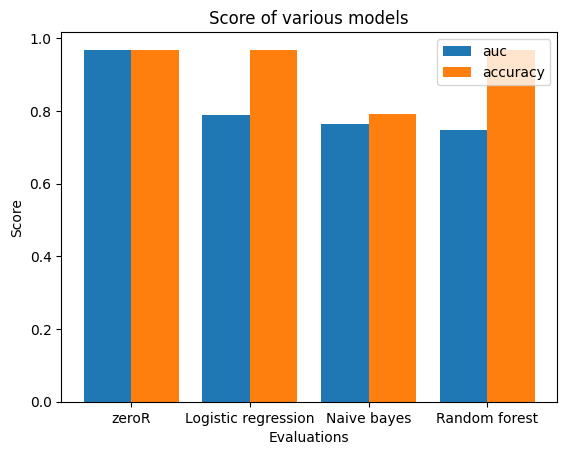

F1:  0.00909090909090909 0.14544551646118362 0.0
auc:  [0.9687051392477749, 0.7894076139307232, 0.7637307347209169, 0.7470995902967476]
accuracy:  [0.9687051392477749, 0.9684180278313066, 0.7911259515449763, 0.9682744528133597]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


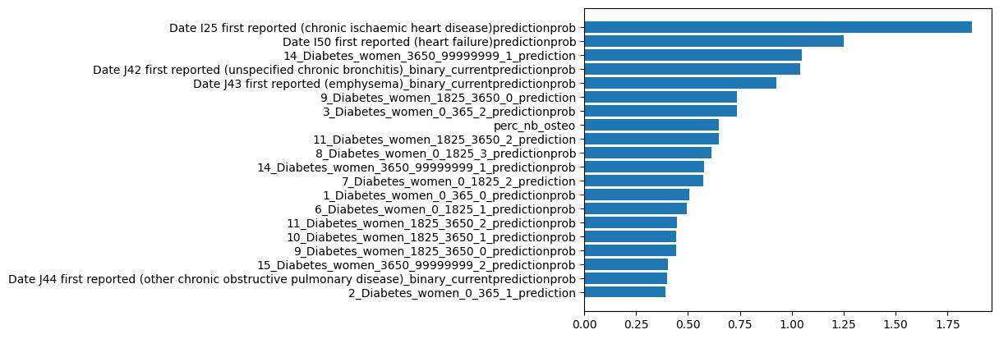

In [216]:
analysis_function(meta_col_women_current,'Date I50 first reported (heart failure)_binary', False)

##### Sampled

Number of missing values: 
 perc_nb_osteo                                                                                         0
perc_linreg_osteo                                                                                     0
perc_nb_asthma                                                                                        0
perc_linreg_asthma                                                                                    0
1_Diabetes_women_0_365_0_prediction                                                                   0
1_Diabetes_women_0_365_0_predictionprob                                                               0
2_Diabetes_women_0_365_1_prediction                                                                   0
2_Diabetes_women_0_365_1_predictionprob                                                               0
3_Diabetes_women_0_365_2_prediction                                                                   0
3_Diabetes_women_0_365_2_predictionp

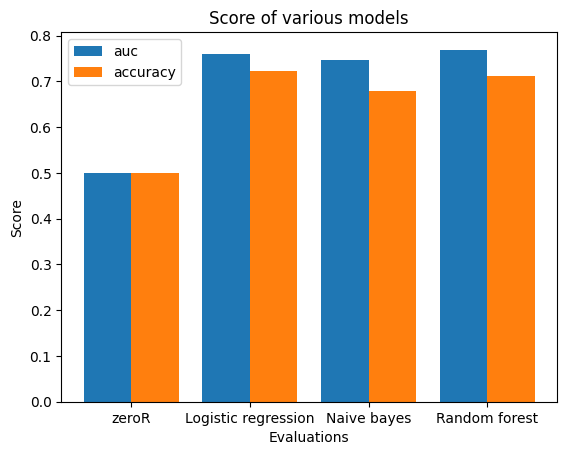

F1:  0.704970556869291 0.6540809613902493 0.7087034224432598
auc:  [0.5, 0.7591413607534114, 0.746975302709975, 0.7691584182202575]
accuracy:  [0.5, 0.7224137931034482, 0.6788923719958203, 0.7109979101358411]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


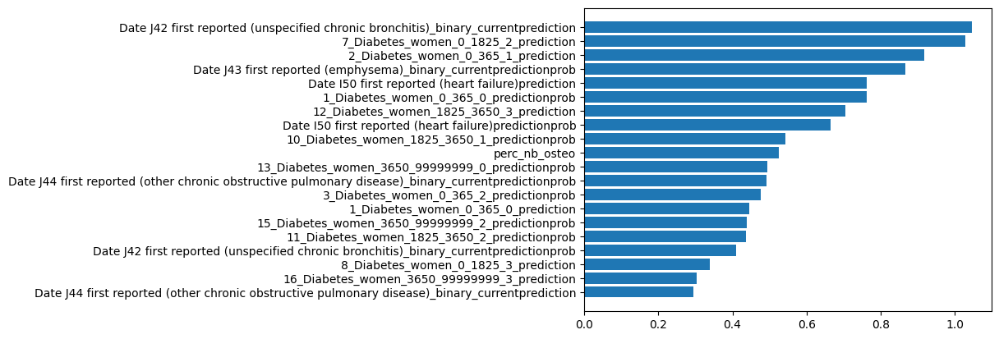

In [217]:
analysis_function(meta_col_women_current,'Date I50 first reported (heart failure)_binary', True)

#### Women past

##### Unsampled

Number of missing values: 
 perc_nb_osteo                                                                                      0
perc_linreg_osteo                                                                                  0
perc_nb_asthma                                                                                     0
perc_linreg_asthma                                                                                 0
1_Diabetes_women_0_365_0_prediction                                                                0
1_Diabetes_women_0_365_0_predictionprob                                                            0
2_Diabetes_women_0_365_1_prediction                                                                0
2_Diabetes_women_0_365_1_predictionprob                                                            0
3_Diabetes_women_0_365_2_prediction                                                                0
3_Diabetes_women_0_365_2_predictionprob                        

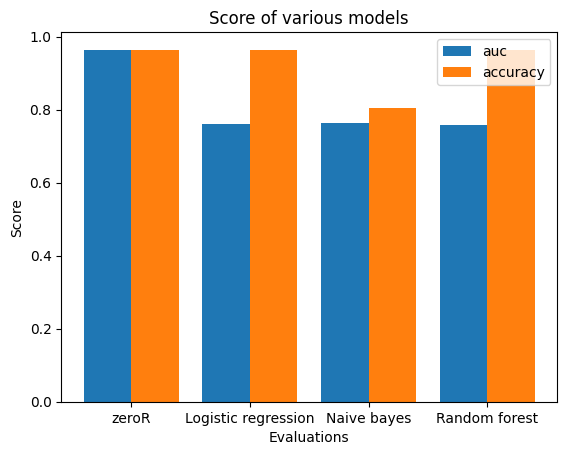

F1:  0.0 0.14535867467602748 0.0
auc:  [0.9639981051634297, 0.7607698607698608, 0.7621601146601147, 0.7566205978705979]
accuracy:  [0.9639981051634297, 0.9621054754462035, 0.8043516744535197, 0.9639989692223231]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


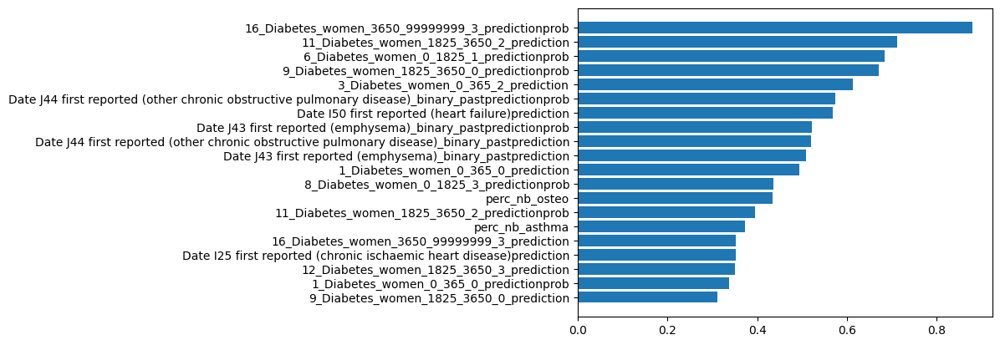

In [219]:
analysis_function(meta_col_women_past,'Date I50 first reported (heart failure)_binary', False)

##### Sampled

Number of missing values: 
 perc_nb_osteo                                                                                      0
perc_linreg_osteo                                                                                  0
perc_nb_asthma                                                                                     0
perc_linreg_asthma                                                                                 0
1_Diabetes_women_0_365_0_prediction                                                                0
1_Diabetes_women_0_365_0_predictionprob                                                            0
2_Diabetes_women_0_365_1_prediction                                                                0
2_Diabetes_women_0_365_1_predictionprob                                                            0
3_Diabetes_women_0_365_2_prediction                                                                0
3_Diabetes_women_0_365_2_predictionprob                        

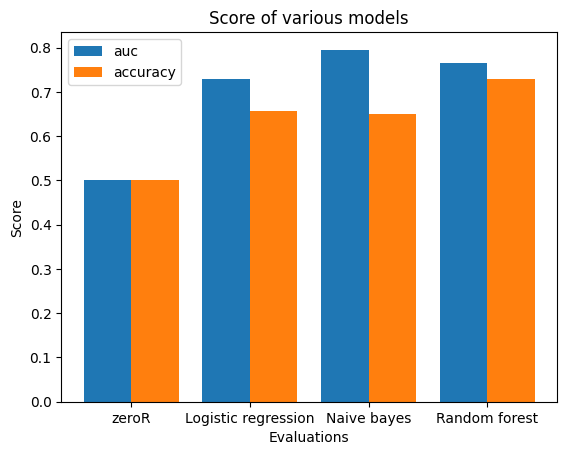

F1:  0.6490114942528735 0.5731999079825166 0.7302651405389743
auc:  [0.5, 0.7294444444444445, 0.7952777777777779, 0.7650277777777778]
accuracy:  [0.5, 0.6572043010752688, 0.650752688172043, 0.7296774193548387]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


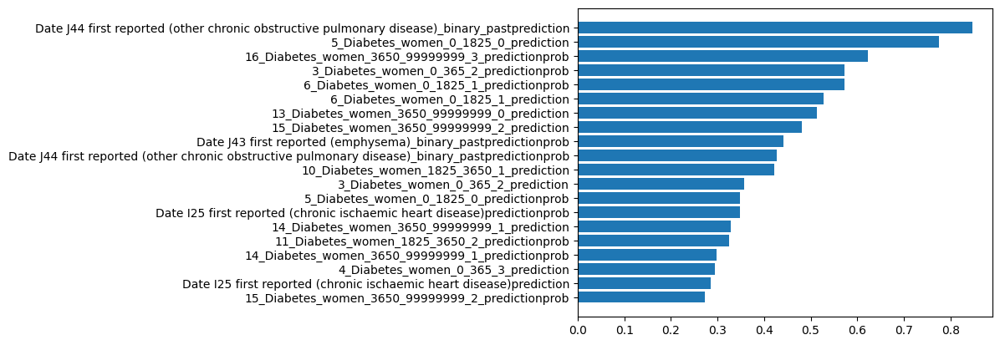

In [220]:
analysis_function(meta_col_women_past,'Date I50 first reported (heart failure)_binary', True)

### CVD chronic ischaemic heart disease

#### Men current

##### Unsampled

Number of missing values: 
 1_Diabetes_men_0_365_0_prediction                                                                     0
1_Diabetes_men_0_365_0_predictionprob                                                                 0
2_Diabetes_men_0_365_1_prediction                                                                     0
2_Diabetes_men_0_365_1_predictionprob                                                                 0
3_Diabetes_men_0_365_2_prediction                                                                     0
3_Diabetes_men_0_365_2_predictionprob                                                                 0
4_Diabetes_men_0_365_3_prediction                                                                     0
4_Diabetes_men_0_365_3_predictionprob                                                                 0
5_Diabetes_men_0_1825_0_prediction                                                                    0
5_Diabetes_men_0_1825_0_predictionpr

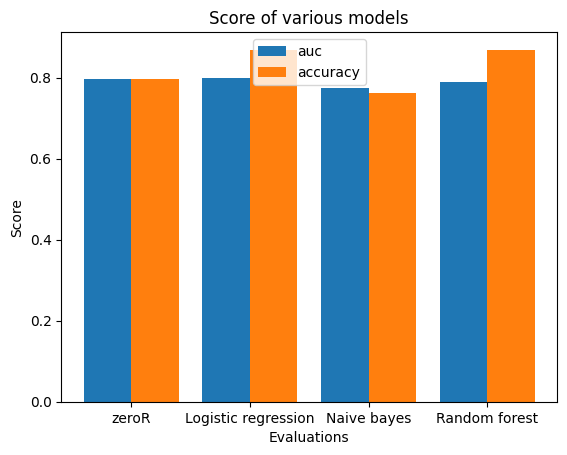

F1:  0.5900486811368777 0.5164946874270843 0.5771603230286698
auc:  [0.7962108936806681, 0.7983960067515042, 0.7736478364719089, 0.7890569395167832]
accuracy:  [0.7962108936806681, 0.8682532764661555, 0.7609372208109011, 0.8686269528670536]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


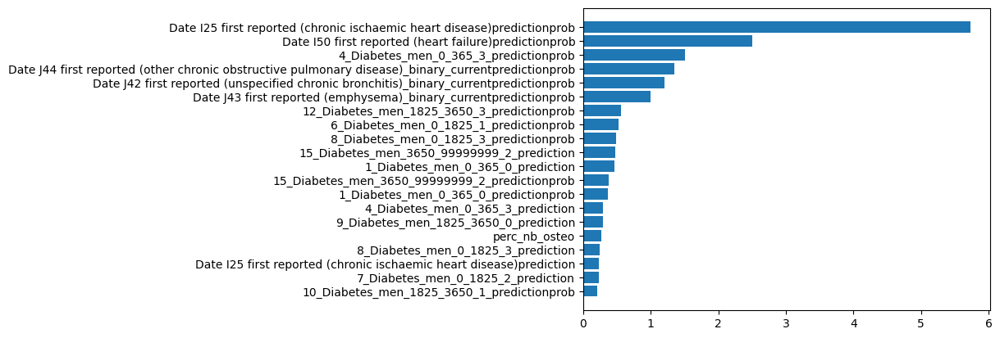

In [222]:
analysis_function(meta_col_men_current,'Date I25 first reported (chronic ischaemic heart disease)_binary', False)

##### Sampled

Number of missing values: 
 1_Diabetes_men_0_365_0_prediction                                                                     0
1_Diabetes_men_0_365_0_predictionprob                                                                 0
2_Diabetes_men_0_365_1_prediction                                                                     0
2_Diabetes_men_0_365_1_predictionprob                                                                 0
3_Diabetes_men_0_365_2_prediction                                                                     0
3_Diabetes_men_0_365_2_predictionprob                                                                 0
4_Diabetes_men_0_365_3_prediction                                                                     0
4_Diabetes_men_0_365_3_predictionprob                                                                 0
5_Diabetes_men_0_1825_0_prediction                                                                    0
5_Diabetes_men_0_1825_0_predictionpr

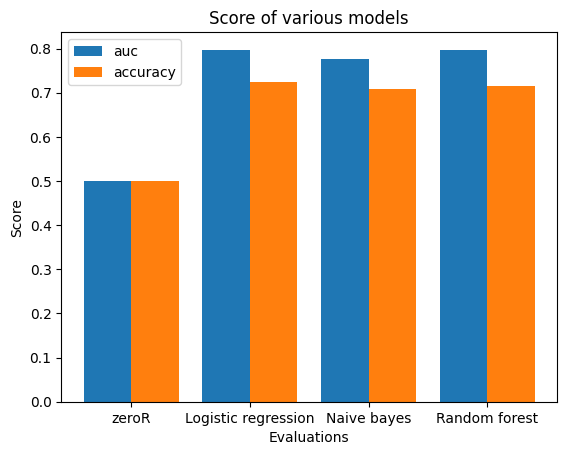

F1:  0.6952680506853678 0.6893004521960919 0.6851233863350434
auc:  [0.5, 0.7968090976255273, 0.7762262809901898, 0.7974179128206567]
accuracy:  [0.5, 0.7244648318042813, 0.709480122324159, 0.7155963302752294]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


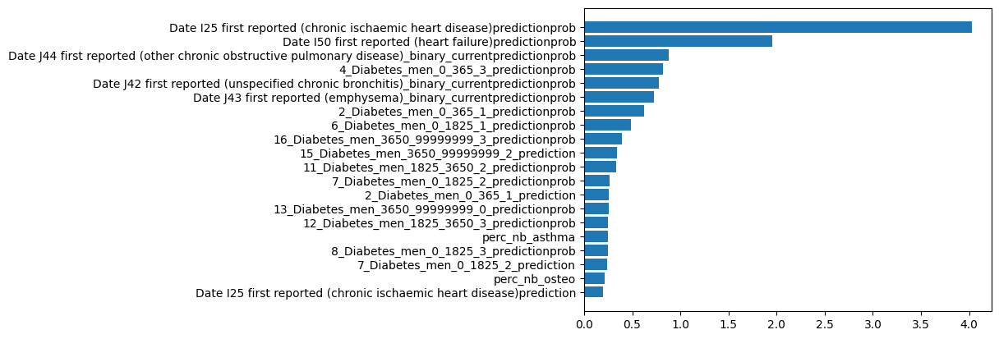

In [223]:
analysis_function(meta_col_men_current,'Date I25 first reported (chronic ischaemic heart disease)_binary', True)

#### Men past

##### Unsampled

Number of missing values: 
 1_Diabetes_men_0_365_0_prediction                                                                  0
1_Diabetes_men_0_365_0_predictionprob                                                              0
2_Diabetes_men_0_365_1_prediction                                                                  0
2_Diabetes_men_0_365_1_predictionprob                                                              0
3_Diabetes_men_0_365_2_prediction                                                                  0
3_Diabetes_men_0_365_2_predictionprob                                                              0
4_Diabetes_men_0_365_3_prediction                                                                  0
4_Diabetes_men_0_365_3_predictionprob                                                              0
5_Diabetes_men_0_1825_0_prediction                                                                 0
5_Diabetes_men_0_1825_0_predictionprob                         

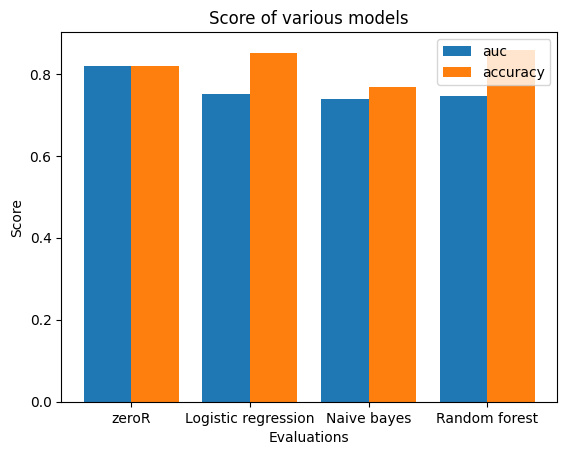

F1:  0.42077606389532995 0.43153911212920165 0.4491382208773513
auc:  [0.8180956892468024, 0.7519099595043035, 0.739408372080559, 0.746820624008558]
accuracy:  [0.8180956892468024, 0.8517259924036167, 0.7674139804824488, 0.8588293950903612]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


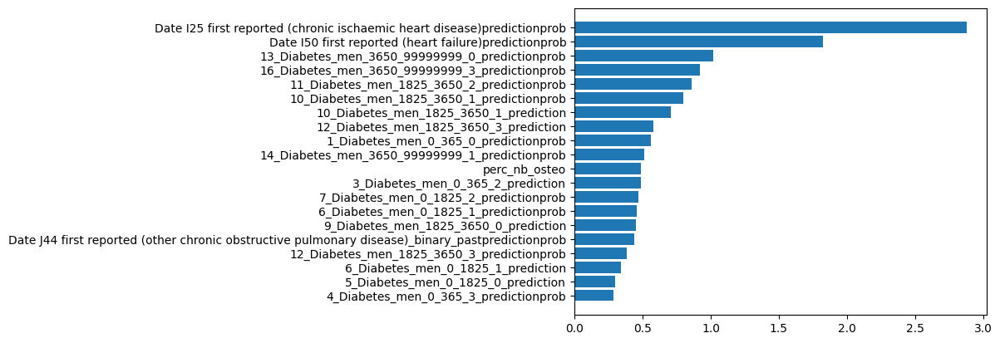

In [225]:
analysis_function(meta_col_men_past,'Date I25 first reported (chronic ischaemic heart disease)_binary', False)

##### Sampled

Number of missing values: 
 1_Diabetes_men_0_365_0_prediction                                                                  0
1_Diabetes_men_0_365_0_predictionprob                                                              0
2_Diabetes_men_0_365_1_prediction                                                                  0
2_Diabetes_men_0_365_1_predictionprob                                                              0
3_Diabetes_men_0_365_2_prediction                                                                  0
3_Diabetes_men_0_365_2_predictionprob                                                              0
4_Diabetes_men_0_365_3_prediction                                                                  0
4_Diabetes_men_0_365_3_predictionprob                                                              0
5_Diabetes_men_0_1825_0_prediction                                                                 0
5_Diabetes_men_0_1825_0_predictionprob                         

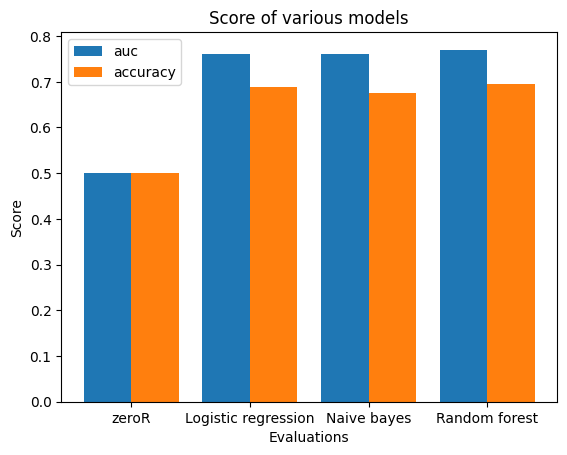

F1:  0.6729885542445546 0.621385974720679 0.6863835745563185
auc:  [0.5, 0.759919574615405, 0.7603350169994052, 0.7701744769243061]
accuracy:  [0.5, 0.6888209829386299, 0.6757321110262287, 0.6952720482132246]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


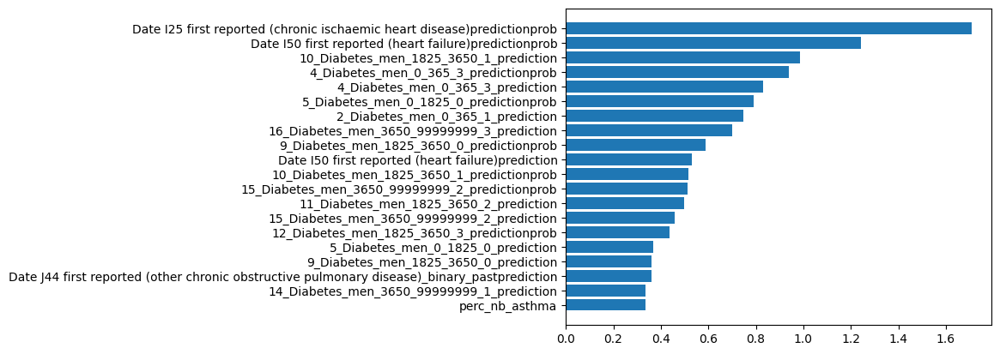

In [227]:
analysis_function(meta_col_men_past,'Date I25 first reported (chronic ischaemic heart disease)_binary', True)

#### Women current

##### Unsampled

Number of missing values: 
 perc_nb_osteo                                                                                         0
perc_linreg_osteo                                                                                     0
perc_nb_asthma                                                                                        0
perc_linreg_asthma                                                                                    0
1_Diabetes_women_0_365_0_prediction                                                                   0
1_Diabetes_women_0_365_0_predictionprob                                                               0
2_Diabetes_women_0_365_1_prediction                                                                   0
2_Diabetes_women_0_365_1_predictionprob                                                               0
3_Diabetes_women_0_365_2_prediction                                                                   0
3_Diabetes_women_0_365_2_predictionp

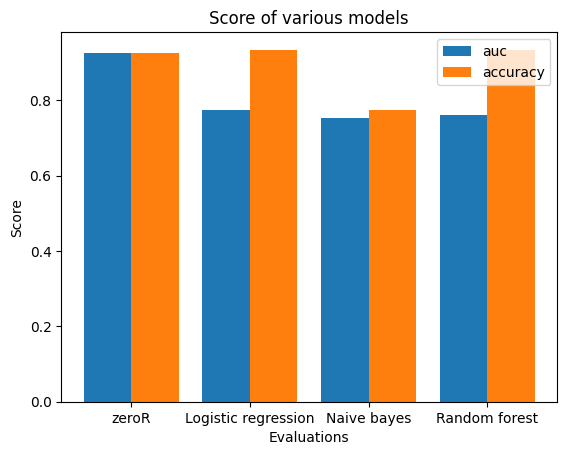

F1:  0.265998949328419 0.2678764584977964 0.2838541160206718
auc:  [0.9259259259259259, 0.7731609554741187, 0.752245796932803, 0.7594473632411091]
accuracy:  [0.9259259259259259, 0.9338215982556768, 0.7747612833587902, 0.9338220102356423]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


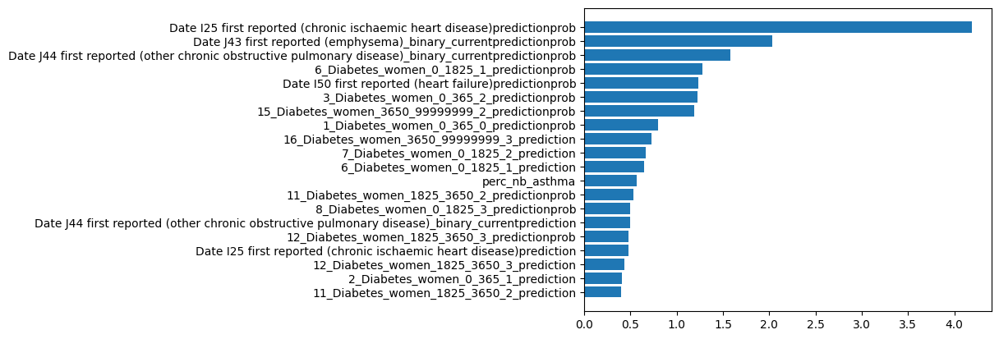

In [228]:
analysis_function(meta_col_women_current,'Date I25 first reported (chronic ischaemic heart disease)_binary', False)

##### Sampled

Number of missing values: 
 perc_nb_osteo                                                                                         0
perc_linreg_osteo                                                                                     0
perc_nb_asthma                                                                                        0
perc_linreg_asthma                                                                                    0
1_Diabetes_women_0_365_0_prediction                                                                   0
1_Diabetes_women_0_365_0_predictionprob                                                               0
2_Diabetes_women_0_365_1_prediction                                                                   0
2_Diabetes_women_0_365_1_predictionprob                                                               0
3_Diabetes_women_0_365_2_prediction                                                                   0
3_Diabetes_women_0_365_2_predictionp

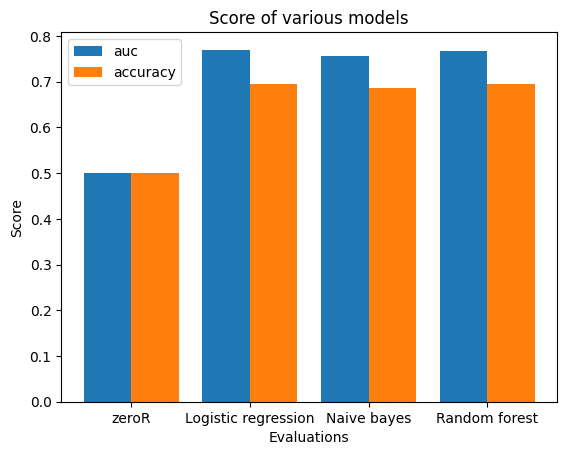

F1:  0.6729502161769529 0.6596215425567947 0.6834254154271001
auc:  [0.5, 0.7697089553862105, 0.7553260294234939, 0.7679109536895379]
accuracy:  [0.5, 0.6938511326860841, 0.6851273392429998, 0.694770414145678]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


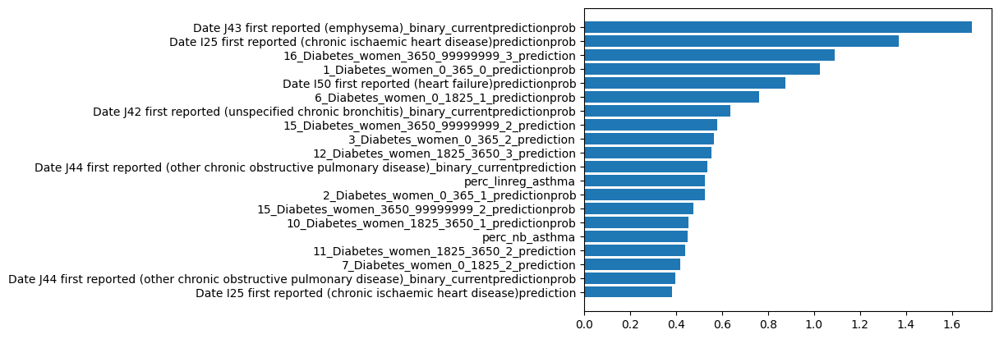

In [229]:
analysis_function(meta_col_women_current,'Date I25 first reported (chronic ischaemic heart disease)_binary', True)

#### Women past

##### Unsampled

Number of missing values: 
 perc_nb_osteo                                                                                      0
perc_linreg_osteo                                                                                  0
perc_nb_asthma                                                                                     0
perc_linreg_asthma                                                                                 0
1_Diabetes_women_0_365_0_prediction                                                                0
1_Diabetes_women_0_365_0_predictionprob                                                            0
2_Diabetes_women_0_365_1_prediction                                                                0
2_Diabetes_women_0_365_1_predictionprob                                                            0
3_Diabetes_women_0_365_2_prediction                                                                0
3_Diabetes_women_0_365_2_predictionprob                        

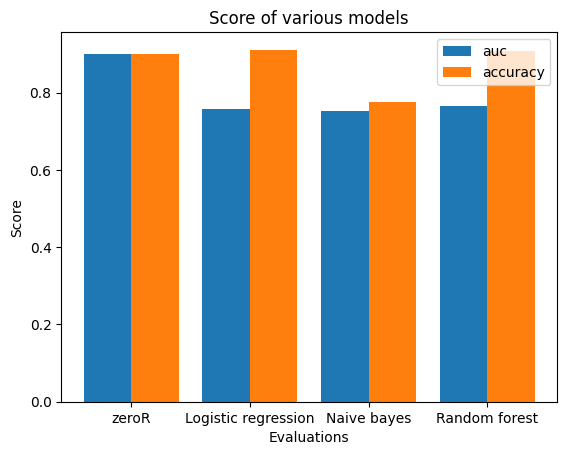

F1:  0.29213030156426384 0.34102517932952714 0.24715745916067072
auc:  [0.8995736617716722, 0.7579872881258186, 0.751437541435967, 0.7641033291334122]
accuracy:  [0.8995736617716722, 0.9109464107649042, 0.7749980392815928, 0.908580103750014]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


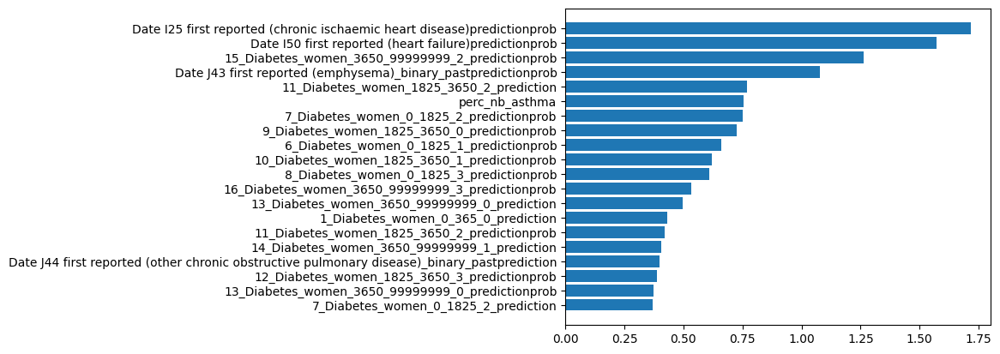

In [231]:
analysis_function(meta_col_women_past,'Date I25 first reported (chronic ischaemic heart disease)_binary', False)

##### Sampled

Number of missing values: 
 perc_nb_osteo                                                                                      0
perc_linreg_osteo                                                                                  0
perc_nb_asthma                                                                                     0
perc_linreg_asthma                                                                                 0
1_Diabetes_women_0_365_0_prediction                                                                0
1_Diabetes_women_0_365_0_predictionprob                                                            0
2_Diabetes_women_0_365_1_prediction                                                                0
2_Diabetes_women_0_365_1_predictionprob                                                            0
3_Diabetes_women_0_365_2_prediction                                                                0
3_Diabetes_women_0_365_2_predictionprob                        

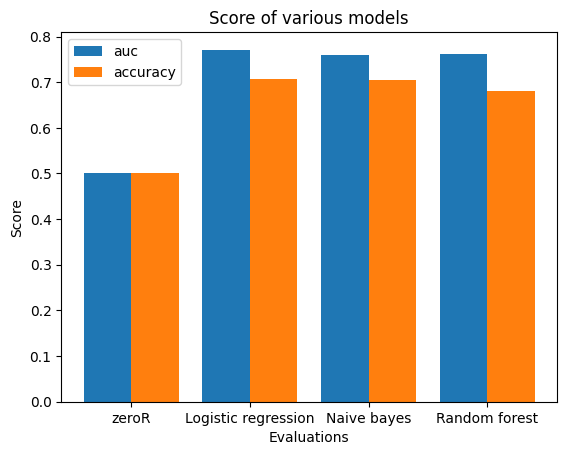

F1:  0.6776541688206096 0.6780052715595649 0.6601619895263213
auc:  [0.5, 0.771172810209355, 0.7585693192005484, 0.761000369139904]
accuracy:  [0.5, 0.7074509803921568, 0.7052941176470588, 0.6815686274509803]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


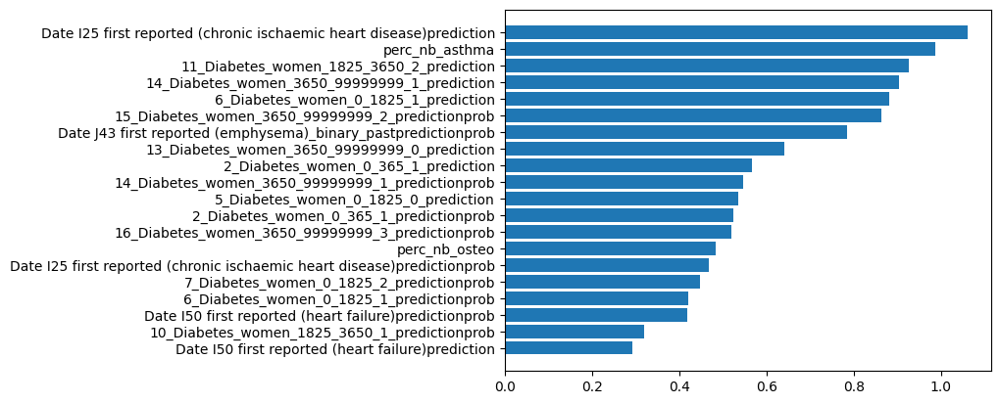

In [232]:
analysis_function(meta_col_women_past,'Date I25 first reported (chronic ischaemic heart disease)_binary', True)

### Diabetes

#### Men current

##### Unsampled

Number of missing values: 
 1_Diabetes_men_0_365_0_prediction                                                                     0
1_Diabetes_men_0_365_0_predictionprob                                                                 0
2_Diabetes_men_0_365_1_prediction                                                                     0
2_Diabetes_men_0_365_1_predictionprob                                                                 0
3_Diabetes_men_0_365_2_prediction                                                                     0
3_Diabetes_men_0_365_2_predictionprob                                                                 0
4_Diabetes_men_0_365_3_prediction                                                                     0
4_Diabetes_men_0_365_3_predictionprob                                                                 0
5_Diabetes_men_0_1825_0_prediction                                                                    0
5_Diabetes_men_0_1825_0_predictionpr

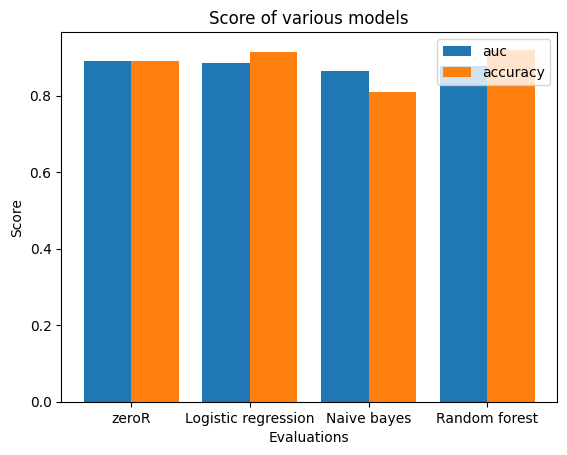

F1:  0.536773241895215 0.47166594116011396 0.565974863154366
auc:  [0.889442851801072, 0.8838642632660954, 0.8644103283141816, 0.8773768662110909]
accuracy:  [0.889442851801072, 0.9148693686344885, 0.8087969329013913, 0.919605581062919]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


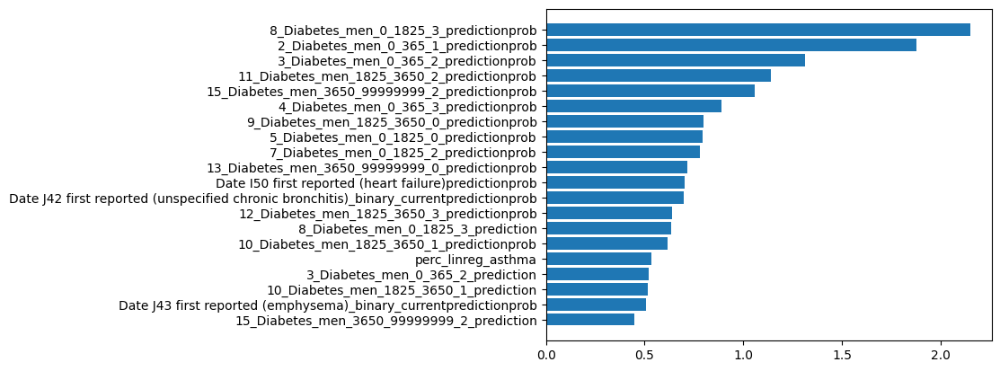

In [234]:
analysis_function(meta_col_men_current,'Date E11 first reported (non-insulin-dependent diabetes mellitus)_onehot', False)

##### Sampled

Number of missing values: 
 1_Diabetes_men_0_365_0_prediction                                                                     0
1_Diabetes_men_0_365_0_predictionprob                                                                 0
2_Diabetes_men_0_365_1_prediction                                                                     0
2_Diabetes_men_0_365_1_predictionprob                                                                 0
3_Diabetes_men_0_365_2_prediction                                                                     0
3_Diabetes_men_0_365_2_predictionprob                                                                 0
4_Diabetes_men_0_365_3_prediction                                                                     0
4_Diabetes_men_0_365_3_predictionprob                                                                 0
5_Diabetes_men_0_1825_0_prediction                                                                    0
5_Diabetes_men_0_1825_0_predictionpr

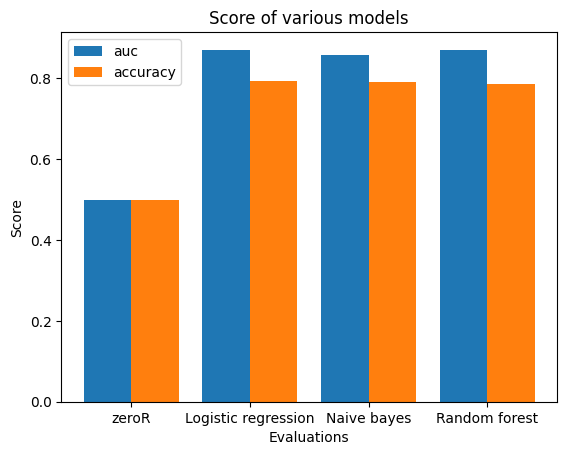

F1:  0.7879392528524652 0.7888992737562924 0.7808421293952872
auc:  [0.5, 0.8703628149386665, 0.8582244938727481, 0.8708182927043581]
accuracy:  [0.5, 0.7931216678602689, 0.7897413861701281, 0.7857897668496857]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


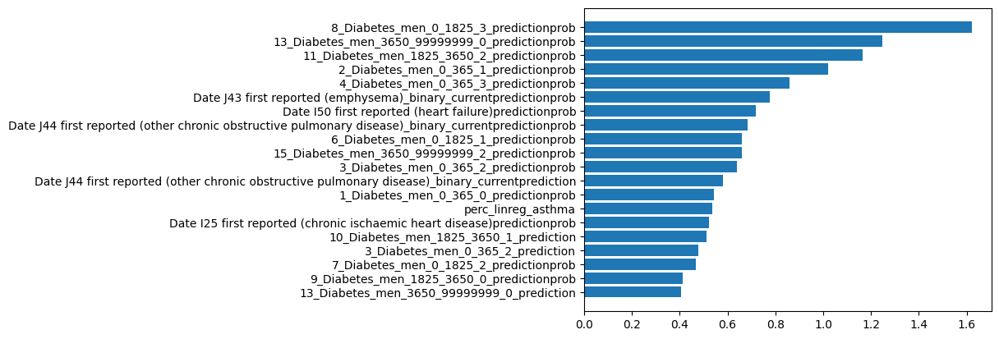

In [235]:
analysis_function(meta_col_men_current,'Date E11 first reported (non-insulin-dependent diabetes mellitus)_onehot', True)

#### men past

##### Unsampled

Number of missing values: 
 1_Diabetes_men_0_365_0_prediction                                                                  0
1_Diabetes_men_0_365_0_predictionprob                                                              0
2_Diabetes_men_0_365_1_prediction                                                                  0
2_Diabetes_men_0_365_1_predictionprob                                                              0
3_Diabetes_men_0_365_2_prediction                                                                  0
3_Diabetes_men_0_365_2_predictionprob                                                              0
4_Diabetes_men_0_365_3_prediction                                                                  0
4_Diabetes_men_0_365_3_predictionprob                                                              0
5_Diabetes_men_0_1825_0_prediction                                                                 0
5_Diabetes_men_0_1825_0_predictionprob                         

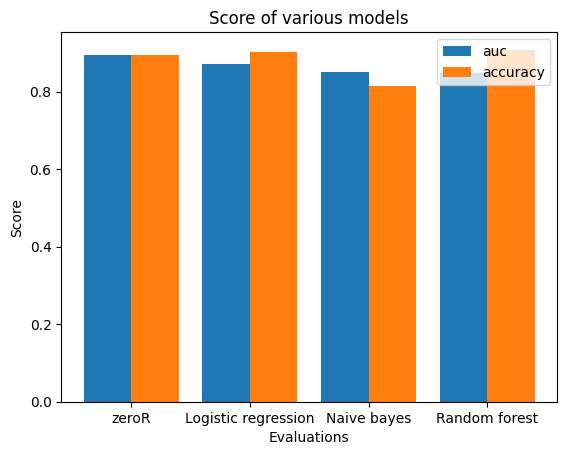

F1:  0.4133854091890641 0.44246541654224664 0.40276106522437916
auc:  [0.8934154429180483, 0.8703994061848468, 0.8511757789535568, 0.8472030807279849]
accuracy:  [0.8934154429180483, 0.9028839366743975, 0.8138415515444859, 0.9080927251745039]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


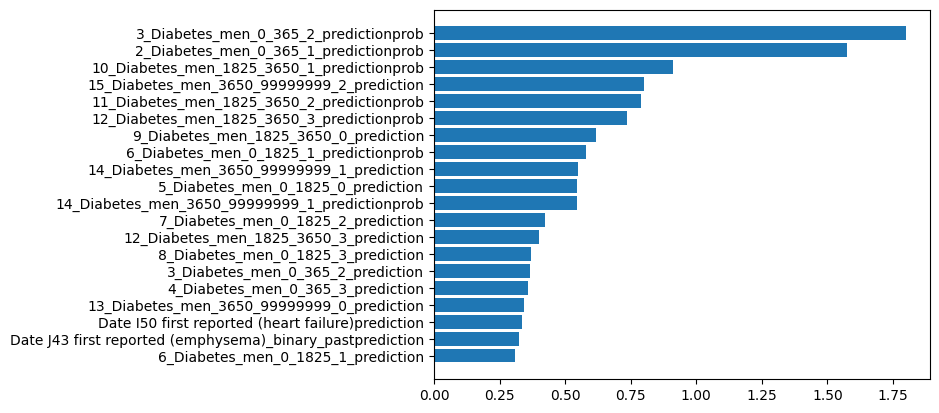

In [236]:
analysis_function(meta_col_men_past,'Date E11 first reported (non-insulin-dependent diabetes mellitus)_onehot', False)

##### Sampled

Number of missing values: 
 1_Diabetes_men_0_365_0_prediction                                                                  0
1_Diabetes_men_0_365_0_predictionprob                                                              0
2_Diabetes_men_0_365_1_prediction                                                                  0
2_Diabetes_men_0_365_1_predictionprob                                                              0
3_Diabetes_men_0_365_2_prediction                                                                  0
3_Diabetes_men_0_365_2_predictionprob                                                              0
4_Diabetes_men_0_365_3_prediction                                                                  0
4_Diabetes_men_0_365_3_predictionprob                                                              0
5_Diabetes_men_0_1825_0_prediction                                                                 0
5_Diabetes_men_0_1825_0_predictionprob                         

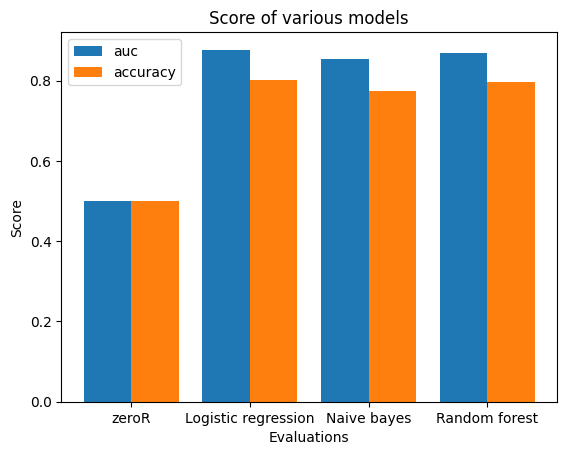

F1:  0.7988765464162597 0.7574396542561337 0.7938778948891309
auc:  [0.5, 0.8767407407407407, 0.8529876543209877, 0.869037037037037]
accuracy:  [0.5, 0.8022222222222223, 0.7733333333333333, 0.7955555555555556]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


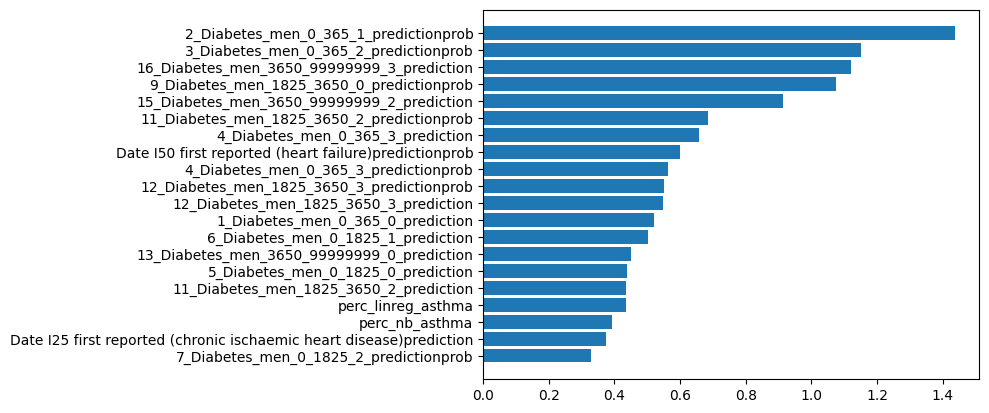

In [239]:
analysis_function(meta_col_men_past,'Date E11 first reported (non-insulin-dependent diabetes mellitus)_onehot', True)

#### Women current

##### Unsampled

Number of missing values: 
 perc_nb_osteo                                                                                         0
perc_linreg_osteo                                                                                     0
perc_nb_asthma                                                                                        0
perc_linreg_asthma                                                                                    0
1_Diabetes_women_0_365_0_prediction                                                                   0
1_Diabetes_women_0_365_0_predictionprob                                                               0
2_Diabetes_women_0_365_1_prediction                                                                   0
2_Diabetes_women_0_365_1_predictionprob                                                               0
3_Diabetes_women_0_365_2_prediction                                                                   0
3_Diabetes_women_0_365_2_predictionp

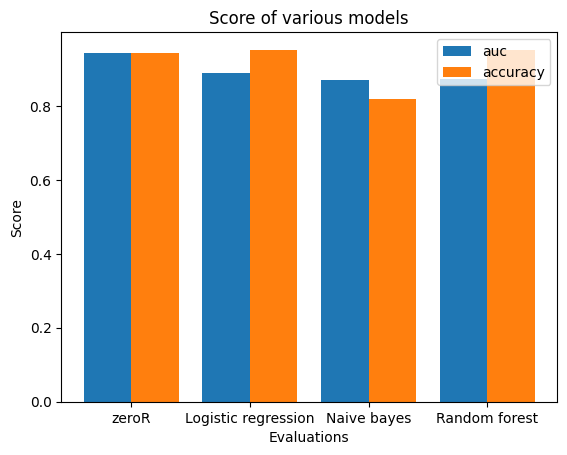

F1:  0.4029760087078707 0.3274818719880126 0.4243938257632573
auc:  [0.9431524547803618, 0.8884891769261892, 0.8707354343679556, 0.8740895516636803]
accuracy:  [0.9431524547803618, 0.9517653856492959, 0.8198368353346976, 0.9521963166931192]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


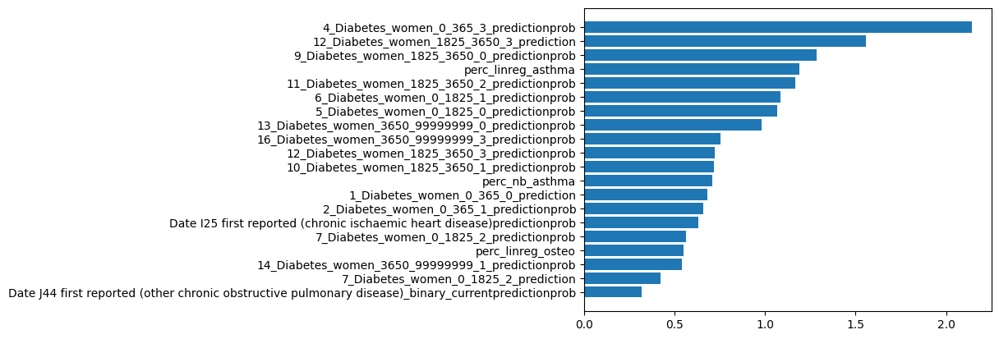

In [240]:
analysis_function(meta_col_women_current,'Date E11 first reported (non-insulin-dependent diabetes mellitus)_onehot', False)

##### Sampled

Number of missing values: 
 perc_nb_osteo                                                                                         0
perc_linreg_osteo                                                                                     0
perc_nb_asthma                                                                                        0
perc_linreg_asthma                                                                                    0
1_Diabetes_women_0_365_0_prediction                                                                   0
1_Diabetes_women_0_365_0_predictionprob                                                               0
2_Diabetes_women_0_365_1_prediction                                                                   0
2_Diabetes_women_0_365_1_predictionprob                                                               0
3_Diabetes_women_0_365_2_prediction                                                                   0
3_Diabetes_women_0_365_2_predictionp

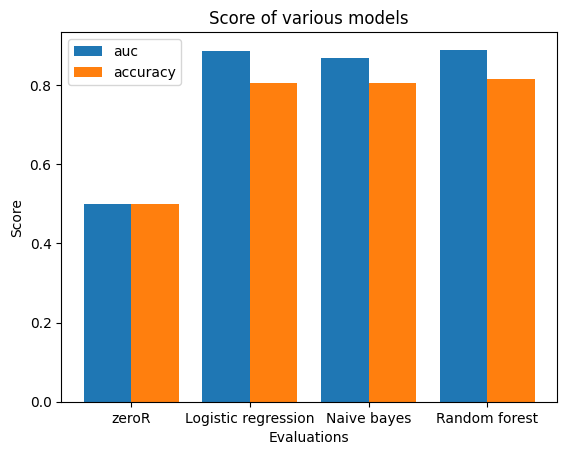

F1:  0.803118286137668 0.8056968107884315 0.8123315170227333
auc:  [0.5, 0.8862554077872136, 0.8686518586764941, 0.8891976446082359]
accuracy:  [0.5, 0.8055807658625905, 0.8043706711249105, 0.8156993869914816]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


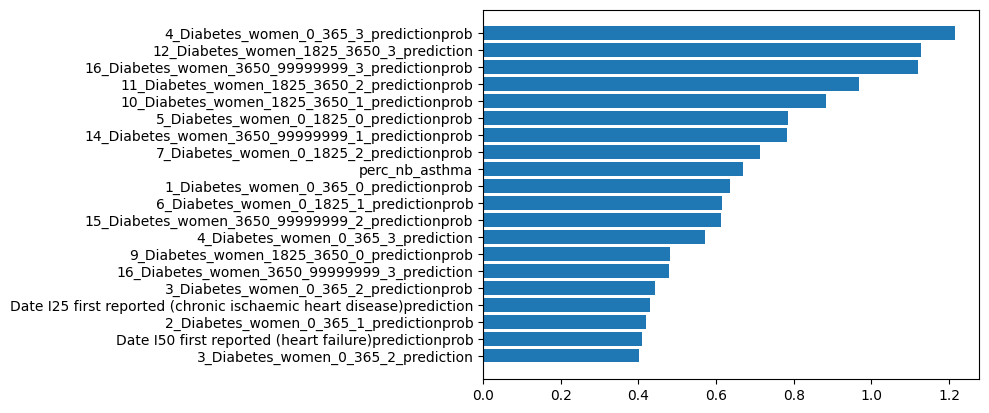

In [241]:
analysis_function(meta_col_women_current,'Date E11 first reported (non-insulin-dependent diabetes mellitus)_onehot', True)

#### Women past

##### Unsampled

Number of missing values: 
 perc_nb_osteo                                                                                         0
perc_linreg_osteo                                                                                     0
perc_nb_asthma                                                                                        0
perc_linreg_asthma                                                                                    0
1_Diabetes_women_0_365_0_prediction                                                                   0
1_Diabetes_women_0_365_0_predictionprob                                                               0
2_Diabetes_women_0_365_1_prediction                                                                   0
2_Diabetes_women_0_365_1_predictionprob                                                               0
3_Diabetes_women_0_365_2_prediction                                                                   0
3_Diabetes_women_0_365_2_predictionp

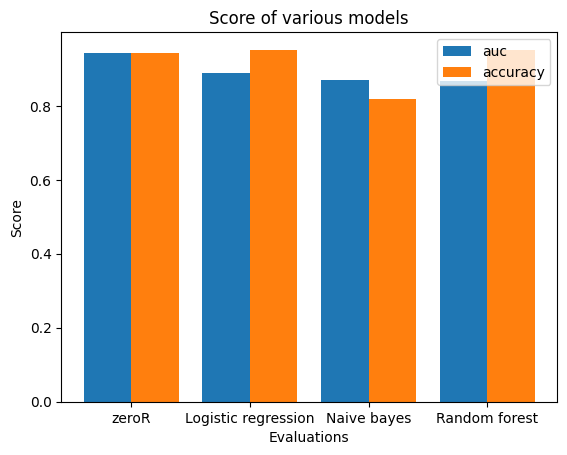

F1:  0.4029760087078707 0.3274818719880126 0.4038129784572275
auc:  [0.9431524547803618, 0.8884891769261892, 0.8707354343679556, 0.8678803007533283]
accuracy:  [0.9431524547803618, 0.9517653856492959, 0.8198368353346976, 0.9511917035474565]
FEATURE IMPORTANCE


c:\users\keimp\appdata\local\programs\python\python39\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


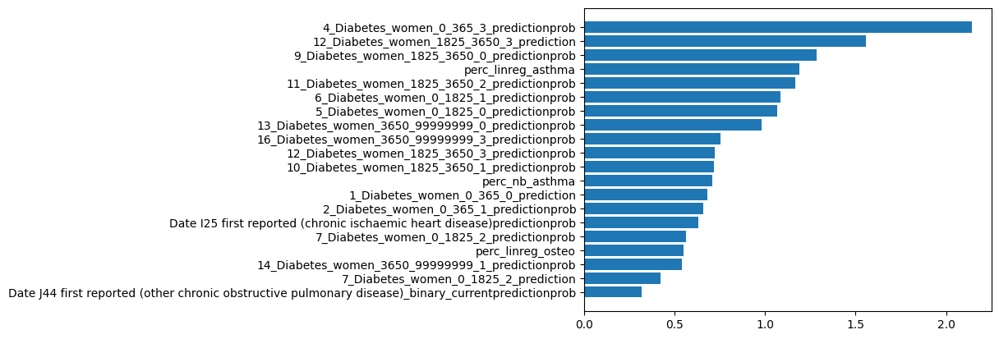

In [242]:
analysis_function(meta_col_women_current,'Date E11 first reported (non-insulin-dependent diabetes mellitus)_onehot', False)

##### Sampled

Number of missing values: 
 perc_nb_osteo                                                                                      0
perc_linreg_osteo                                                                                  0
perc_nb_asthma                                                                                     0
perc_linreg_asthma                                                                                 0
1_Diabetes_women_0_365_0_prediction                                                                0
1_Diabetes_women_0_365_0_predictionprob                                                            0
2_Diabetes_women_0_365_1_prediction                                                                0
2_Diabetes_women_0_365_1_predictionprob                                                            0
3_Diabetes_women_0_365_2_prediction                                                                0
3_Diabetes_women_0_365_2_predictionprob                        

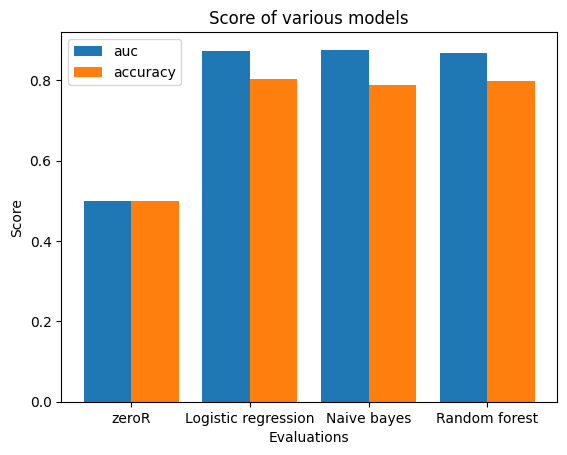

F1:  0.7981651468842355 0.786351297805503 0.7932733502400364
auc:  [0.5, 0.8724477662646509, 0.8760064549006286, 0.8666426023441481]
accuracy:  [0.5, 0.8019963702359346, 0.7879612825166364, 0.7986085904416212]
FEATURE IMPORTANCE


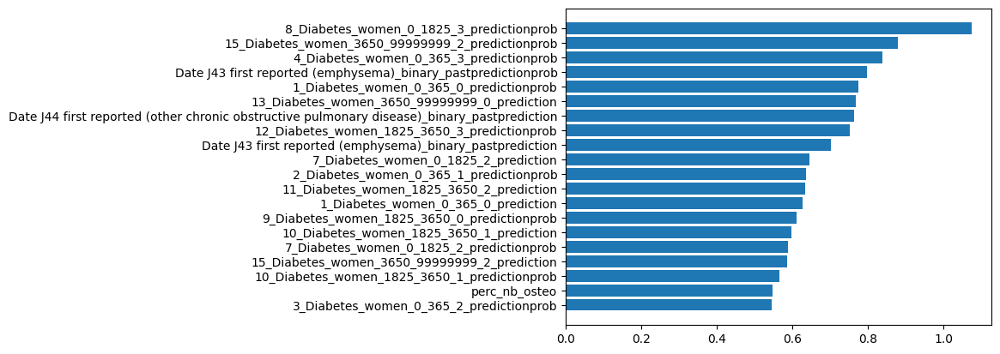

In [243]:
analysis_function(meta_col_women_past,'Date E11 first reported (non-insulin-dependent diabetes mellitus)_onehot', True)

In [162]:
df.columns.tolist()

['Unnamed: 0',
 'Unnamed: 0.1',
 'Participant ID',
 'Haemoglobin concentration | Instance 0',
 'Albumin | Instance 0',
 'Creatinine | Instance 0',
 'C-reactive protein | Instance 0',
 'Cholesterol | Instance 0',
 'HDL cholesterol | Instance 0',
 'LDL direct | Instance 0',
 'Glucose | Instance 0',
 'Triglycerides | Instance 0',
 'Vitamin D | Instance 0',
 'Glycated haemoglobin (HbA1c) | Instance 0',
 'Alanine aminotransferase | Instance 0',
 'Alkaline phosphatase | Instance 0',
 'Apolipoprotein A | Instance 0',
 'Apolipoprotein B | Instance 0',
 'Aspartate aminotransferase | Instance 0',
 'Calcium | Instance 0',
 'Direct bilirubin | Instance 0',
 'Gamma glutamyltransferase | Instance 0',
 'IGF-1 | Instance 0',
 'Lipoprotein A | Instance 0',
 'Rheumatoid factor | Instance 0',
 'Phosphate | Instance 0',
 'trigl_hdl_ratio',
 'apob_apoa_ratio',
 'Age at recruitment',
 'Sex',
 'Asian',
 'Black',
 'Chinese',
 'Mixed',
 'Other',
 'White',
 'Alcohol intake frequency. | Instance 0_Daily or almos

In [4]:
df.shape

(100463, 962)

In [206]:
import re

In [233]:
for i in df.columns.tolist():
    if re.search("iabet", i):
        print(i)

Diabetes diagnosed by doctor | Instance 0
Diabetes diagnosed by doctor | Instance 1
Diabetes diagnosed by doctor | Instance 2
Diabetes diagnosed by doctor | Instance 3
Gestational diabetes only | Instance 0
Gestational diabetes only | Instance 1
Gestational diabetes only | Instance 2
Gestational diabetes only | Instance 3
Gestational diabetes only (pilot) | Instance 0
Medication for cholesterol, blood pressure or diabetes | Instance 0
Medication for cholesterol, blood pressure or diabetes | Instance 1
Medication for cholesterol, blood pressure or diabetes | Instance 2
Medication for cholesterol, blood pressure or diabetes | Instance 3
Medication for cholesterol, blood pressure, diabetes, or take exogenous hormones | Instance 0
Medication for cholesterol, blood pressure, diabetes, or take exogenous hormones | Instance 1
Medication for cholesterol, blood pressure, diabetes, or take exogenous hormones | Instance 2
Medication for cholesterol, blood pressure, diabetes, or take exogenous hor